# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

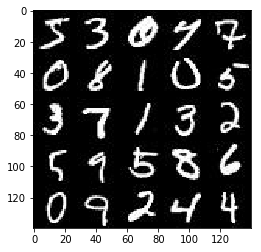

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

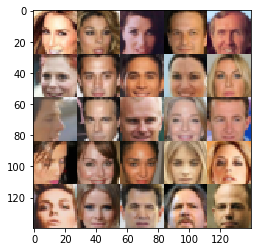

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1


C:\Users\Dawn\Anaconda\lib\site-packages\ipykernel\__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    real_input = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels), name='real_input')
    z_input = tf.placeholder(tf.float32, shape=(None, z_dim), name='z_input')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return (real_input, z_input, learning_rate)



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "C:\\Users\\Dawn\\Anaconda\\lib\\runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "C:\\Users\\Dawn\\Anaconda\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "C:\\Users\\Dawn\\Anaconda\\lib\\site-packages\\ipykernel\\__main__.py", line 3, in <module>\n    app.launch_new_instance()', 'File "C:\\Users\\Dawn\\Anaconda\\lib\\site-packages\\traitlets\\config\\application.py", line 658, in launch_instance\n    app.start()', 'File "C:\\Users\\Dawn\\Anaconda\\lib\\site-packages\\ipykernel\\kernelapp.py", line 474, in start\n    ioloop.IOLoop.instance().start()', 'File "C:\\Users\\Dawn\\Anaconda\\lib\\site-packages\\zmq\\eventloop\\ioloop.py", line 177

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.8):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    with tf.variable_scope('discriminator', reuse=reuse):
        # Input 28x28x3
        
        c1 = tf.layers.conv2d(images, filters=64, kernel_size=(5,5), strides=(2,2), padding='SAME', 
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        d1 = tf.nn.dropout(c1, keep_prob=keep_prob)
        reul1 = tf.maximum(alpha*d1, d1)
        # 14X14x64
        
        c2 = tf.layers.conv2d(c1, filters=128, kernel_size=(5,5), strides=(2,2), padding='SAME', 
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        d2 = tf.nn.dropout(c2, keep_prob=keep_prob)
        bn2 = tf.layers.batch_normalization(d2, training=True)
        relu2 = tf.maximum(alpha*bn2, bn2)
        # 7x7x128
        
        c3 = tf.layers.conv2d(c2, filters=256, kernel_size=(5,5), strides=(2,2), padding='SAME', 
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        d3 = tf.nn.dropout(c3, keep_prob=keep_prob)
        bn3 = tf.layers.batch_normalization(d3, training=True)
        relu3 = tf.maximum(alpha*bn3, bn3)
        # 4x4x256
        
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.8):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    with tf.variable_scope('generator', reuse=not is_train):
        # Project input vector
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape to start convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1, x1)
        # 2x2x512
        
        x2 = tf.layers.conv2d_transpose(x1, filters=256, kernel_size=(5,5), strides=(2,2), padding='VALID',
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        x2 = tf.nn.dropout(x2, keep_prob=keep_prob)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)
        # 7x7x256
        
        x3 = tf.layers.conv2d_transpose(x2, filters=128, kernel_size=(5,5), strides=(2,2), padding='SAME',
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        x3 = tf.nn.dropout(x3, keep_prob=keep_prob)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)
        # 14x14x128
        
        logits = tf.layers.conv2d_transpose(x3, filters=out_channel_dim, kernel_size=(5,5), strides=(2,2), padding='SAME',
                    kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        # 28x28x3
        out = tf.tanh(logits)
        return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, keep_prob=0.8):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_faked = generator(input_z, out_channel_dim, is_train=True, alpha=alpha, keep_prob=keep_prob)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False, alpha=alpha, keep_prob=keep_prob)
    d_model_fake, d_logits_fake = discriminator(g_faked, reuse=True, alpha=alpha, keep_prob=keep_prob)
    
    # Add smoothing to reduce labels
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real, labels=(tf.ones_like(d_model_real) * 0.9)
        )
    )
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)
        )
    )
    
    d_loss = d_loss_fake + d_loss_real
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=(tf.ones_like(d_model_fake))
        )
    )
    
    return d_loss, g_loss
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    alpha = 0.12
    keep_prob = 0.75
    n_samples, width, height, channels = data_shape
    input_real, input_z, learning_rate_tf = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels, alpha=alpha, keep_prob=keep_prob)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate_tf, beta1)
    
    current_step = 0
    print_loss_every = 10
    show_image_every = 50
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                current_step +=1
                
                batch_images *= 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tf:learning_rate})
                sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tf:learning_rate})
                sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tf:learning_rate})
                
                if current_step % print_loss_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if current_step % show_image_every == 0:
                    n_images = 16
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0/2... Discriminator Loss: 1.5041... Generator Loss: 1.3111
Epoch 0/2... Discriminator Loss: 1.9094... Generator Loss: 1.5529
Epoch 0/2... Discriminator Loss: 0.7683... Generator Loss: 1.9152
Epoch 0/2... Discriminator Loss: 1.9088... Generator Loss: 3.8721
Epoch 0/2... Discriminator Loss: 1.8344... Generator Loss: 0.2687


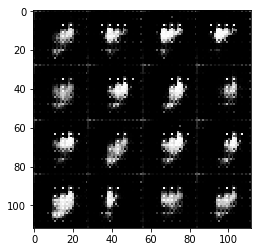

Epoch 0/2... Discriminator Loss: 2.2263... Generator Loss: 0.3445
Epoch 0/2... Discriminator Loss: 1.5317... Generator Loss: 0.4421
Epoch 0/2... Discriminator Loss: 0.6756... Generator Loss: 1.7152
Epoch 0/2... Discriminator Loss: 3.7975... Generator Loss: 6.4020
Epoch 0/2... Discriminator Loss: 1.5272... Generator Loss: 2.4496


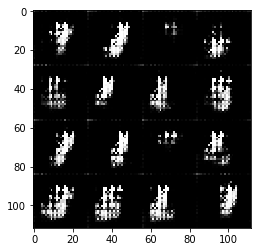

Epoch 0/2... Discriminator Loss: 1.5127... Generator Loss: 1.3567
Epoch 0/2... Discriminator Loss: 1.1191... Generator Loss: 0.8311
Epoch 0/2... Discriminator Loss: 1.8540... Generator Loss: 0.3570
Epoch 0/2... Discriminator Loss: 0.9860... Generator Loss: 1.3637
Epoch 0/2... Discriminator Loss: 1.9483... Generator Loss: 0.8274


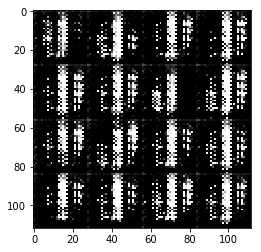

Epoch 0/2... Discriminator Loss: 0.8994... Generator Loss: 1.7692
Epoch 0/2... Discriminator Loss: 2.1735... Generator Loss: 0.6644
Epoch 0/2... Discriminator Loss: 1.3733... Generator Loss: 1.4621
Epoch 0/2... Discriminator Loss: 1.2705... Generator Loss: 1.1218
Epoch 0/2... Discriminator Loss: 1.1818... Generator Loss: 1.7376


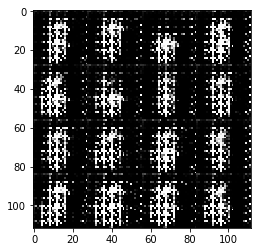

Epoch 0/2... Discriminator Loss: 1.5909... Generator Loss: 0.8302
Epoch 0/2... Discriminator Loss: 1.7616... Generator Loss: 2.5189
Epoch 0/2... Discriminator Loss: 1.1221... Generator Loss: 1.0445
Epoch 0/2... Discriminator Loss: 1.2621... Generator Loss: 0.6133
Epoch 0/2... Discriminator Loss: 1.4517... Generator Loss: 0.6071


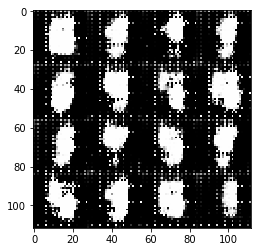

Epoch 0/2... Discriminator Loss: 1.5373... Generator Loss: 0.7569
Epoch 0/2... Discriminator Loss: 1.2362... Generator Loss: 0.6864
Epoch 0/2... Discriminator Loss: 1.5558... Generator Loss: 0.8865
Epoch 0/2... Discriminator Loss: 1.1790... Generator Loss: 1.2284
Epoch 0/2... Discriminator Loss: 1.2982... Generator Loss: 0.6806


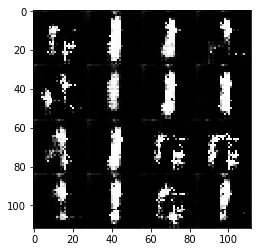

Epoch 0/2... Discriminator Loss: 1.1166... Generator Loss: 1.2698
Epoch 0/2... Discriminator Loss: 1.3570... Generator Loss: 0.6754
Epoch 0/2... Discriminator Loss: 1.6304... Generator Loss: 0.7594
Epoch 0/2... Discriminator Loss: 1.5066... Generator Loss: 0.7993
Epoch 0/2... Discriminator Loss: 1.9308... Generator Loss: 0.3370


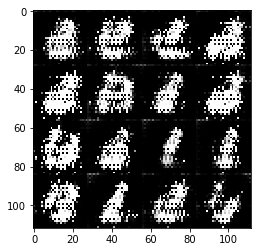

Epoch 0/2... Discriminator Loss: 1.4906... Generator Loss: 1.0036
Epoch 0/2... Discriminator Loss: 0.9866... Generator Loss: 1.1965
Epoch 0/2... Discriminator Loss: 1.6746... Generator Loss: 0.6159
Epoch 0/2... Discriminator Loss: 0.8884... Generator Loss: 1.7275
Epoch 0/2... Discriminator Loss: 2.0285... Generator Loss: 1.4065


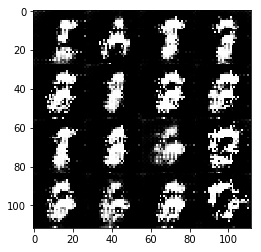

Epoch 0/2... Discriminator Loss: 1.4804... Generator Loss: 1.1234
Epoch 0/2... Discriminator Loss: 1.2884... Generator Loss: 0.8048
Epoch 0/2... Discriminator Loss: 1.3580... Generator Loss: 1.5059
Epoch 0/2... Discriminator Loss: 1.3649... Generator Loss: 1.7414
Epoch 0/2... Discriminator Loss: 1.4132... Generator Loss: 1.0070


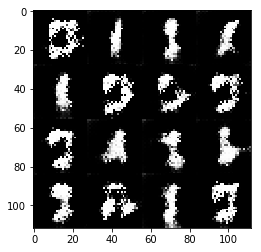

Epoch 0/2... Discriminator Loss: 1.2365... Generator Loss: 1.3193
Epoch 0/2... Discriminator Loss: 1.4572... Generator Loss: 0.6178
Epoch 0/2... Discriminator Loss: 1.3377... Generator Loss: 1.0399
Epoch 0/2... Discriminator Loss: 1.2167... Generator Loss: 1.0005
Epoch 0/2... Discriminator Loss: 1.6986... Generator Loss: 0.7931


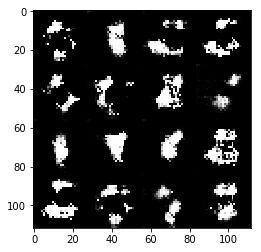

Epoch 0/2... Discriminator Loss: 1.3878... Generator Loss: 0.9135
Epoch 0/2... Discriminator Loss: 1.2152... Generator Loss: 2.8481
Epoch 0/2... Discriminator Loss: 1.2218... Generator Loss: 1.0373
Epoch 0/2... Discriminator Loss: 1.5844... Generator Loss: 0.5656
Epoch 0/2... Discriminator Loss: 1.5544... Generator Loss: 0.6430


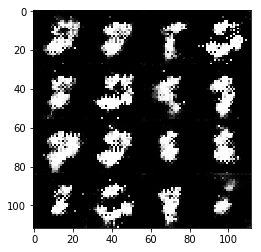

Epoch 0/2... Discriminator Loss: 1.7955... Generator Loss: 1.0180
Epoch 0/2... Discriminator Loss: 1.2954... Generator Loss: 1.2530
Epoch 0/2... Discriminator Loss: 1.5014... Generator Loss: 0.5446
Epoch 0/2... Discriminator Loss: 1.5642... Generator Loss: 1.0538
Epoch 0/2... Discriminator Loss: 1.4253... Generator Loss: 1.0066


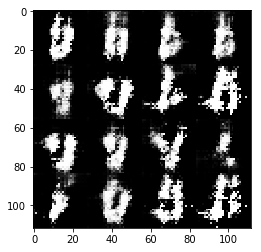

Epoch 0/2... Discriminator Loss: 1.5807... Generator Loss: 0.6797
Epoch 0/2... Discriminator Loss: 1.3629... Generator Loss: 0.8782
Epoch 0/2... Discriminator Loss: 1.1571... Generator Loss: 0.9082
Epoch 0/2... Discriminator Loss: 1.4128... Generator Loss: 1.2488
Epoch 0/2... Discriminator Loss: 1.4267... Generator Loss: 1.0158


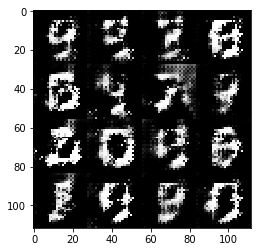

Epoch 0/2... Discriminator Loss: 1.4807... Generator Loss: 0.6962
Epoch 0/2... Discriminator Loss: 1.5025... Generator Loss: 0.8768
Epoch 0/2... Discriminator Loss: 1.5038... Generator Loss: 0.7705
Epoch 0/2... Discriminator Loss: 1.4060... Generator Loss: 0.6865
Epoch 0/2... Discriminator Loss: 1.5181... Generator Loss: 0.7362


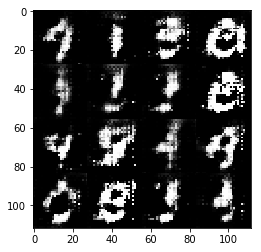

Epoch 0/2... Discriminator Loss: 1.4665... Generator Loss: 1.0403
Epoch 0/2... Discriminator Loss: 1.5483... Generator Loss: 0.8078
Epoch 0/2... Discriminator Loss: 1.4826... Generator Loss: 0.7440
Epoch 0/2... Discriminator Loss: 1.5090... Generator Loss: 0.8575
Epoch 0/2... Discriminator Loss: 1.4268... Generator Loss: 0.7080


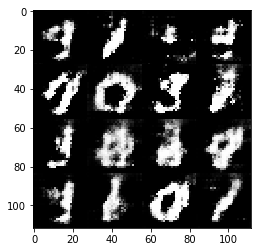

Epoch 0/2... Discriminator Loss: 1.5770... Generator Loss: 0.7793
Epoch 0/2... Discriminator Loss: 1.4337... Generator Loss: 0.7138
Epoch 0/2... Discriminator Loss: 1.6701... Generator Loss: 0.7742
Epoch 0/2... Discriminator Loss: 1.3605... Generator Loss: 1.1555
Epoch 0/2... Discriminator Loss: 1.2293... Generator Loss: 1.0295


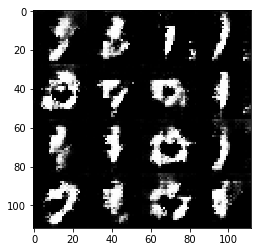

Epoch 0/2... Discriminator Loss: 1.4609... Generator Loss: 0.8363
Epoch 0/2... Discriminator Loss: 1.4751... Generator Loss: 0.8313
Epoch 0/2... Discriminator Loss: 1.3978... Generator Loss: 1.0068
Epoch 0/2... Discriminator Loss: 1.5470... Generator Loss: 1.0146
Epoch 0/2... Discriminator Loss: 1.5466... Generator Loss: 0.8491


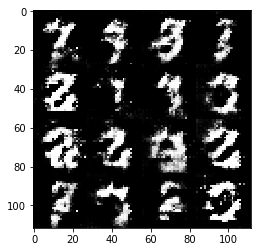

Epoch 0/2... Discriminator Loss: 1.5013... Generator Loss: 0.7538
Epoch 0/2... Discriminator Loss: 1.4260... Generator Loss: 0.9083
Epoch 0/2... Discriminator Loss: 1.5526... Generator Loss: 0.7372
Epoch 0/2... Discriminator Loss: 1.4246... Generator Loss: 0.7600
Epoch 0/2... Discriminator Loss: 1.5440... Generator Loss: 0.6183


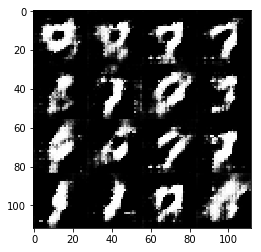

Epoch 0/2... Discriminator Loss: 1.4566... Generator Loss: 0.8290
Epoch 0/2... Discriminator Loss: 1.3697... Generator Loss: 0.8917
Epoch 0/2... Discriminator Loss: 1.4378... Generator Loss: 0.7560
Epoch 0/2... Discriminator Loss: 1.5090... Generator Loss: 0.7810
Epoch 0/2... Discriminator Loss: 1.4219... Generator Loss: 0.8615


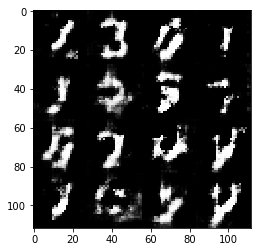

Epoch 0/2... Discriminator Loss: 1.3237... Generator Loss: 0.9922
Epoch 0/2... Discriminator Loss: 1.3342... Generator Loss: 0.9212
Epoch 0/2... Discriminator Loss: 1.5530... Generator Loss: 0.7459
Epoch 0/2... Discriminator Loss: 1.6048... Generator Loss: 0.6520
Epoch 0/2... Discriminator Loss: 1.4757... Generator Loss: 0.7804


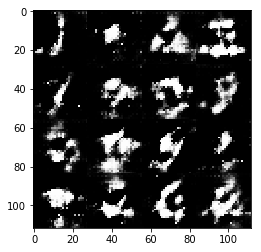

Epoch 0/2... Discriminator Loss: 1.4422... Generator Loss: 0.7269
Epoch 0/2... Discriminator Loss: 1.4624... Generator Loss: 0.7737
Epoch 0/2... Discriminator Loss: 1.3561... Generator Loss: 0.8830
Epoch 0/2... Discriminator Loss: 1.5417... Generator Loss: 0.8760
Epoch 0/2... Discriminator Loss: 1.6172... Generator Loss: 0.7269


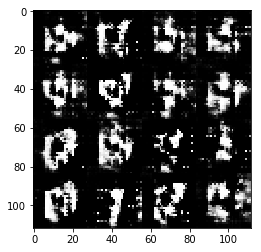

Epoch 0/2... Discriminator Loss: 1.5498... Generator Loss: 0.8025
Epoch 0/2... Discriminator Loss: 1.3019... Generator Loss: 0.7851
Epoch 0/2... Discriminator Loss: 1.3490... Generator Loss: 0.8541
Epoch 0/2... Discriminator Loss: 1.3460... Generator Loss: 0.7904
Epoch 0/2... Discriminator Loss: 1.3189... Generator Loss: 0.8935


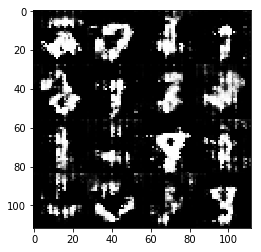

Epoch 0/2... Discriminator Loss: 1.4432... Generator Loss: 0.8153
Epoch 0/2... Discriminator Loss: 1.3329... Generator Loss: 0.9519
Epoch 0/2... Discriminator Loss: 1.4478... Generator Loss: 0.8482
Epoch 0/2... Discriminator Loss: 1.3433... Generator Loss: 0.7608
Epoch 0/2... Discriminator Loss: 1.4220... Generator Loss: 0.7454


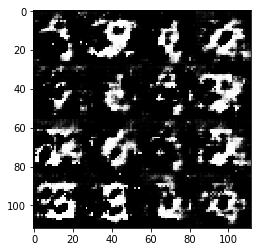

Epoch 0/2... Discriminator Loss: 1.3379... Generator Loss: 0.7071
Epoch 0/2... Discriminator Loss: 1.3401... Generator Loss: 0.8187
Epoch 0/2... Discriminator Loss: 1.3513... Generator Loss: 0.8599
Epoch 0/2... Discriminator Loss: 1.5218... Generator Loss: 0.7111
Epoch 0/2... Discriminator Loss: 1.3813... Generator Loss: 0.9365


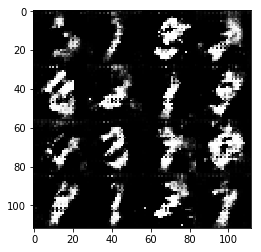

Epoch 0/2... Discriminator Loss: 1.6344... Generator Loss: 0.6213
Epoch 0/2... Discriminator Loss: 1.3885... Generator Loss: 0.8780
Epoch 0/2... Discriminator Loss: 1.4435... Generator Loss: 0.8471
Epoch 0/2... Discriminator Loss: 1.3956... Generator Loss: 0.7030
Epoch 0/2... Discriminator Loss: 1.4983... Generator Loss: 0.7534


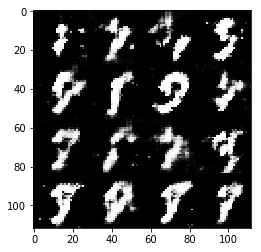

Epoch 0/2... Discriminator Loss: 1.4381... Generator Loss: 0.8024
Epoch 0/2... Discriminator Loss: 1.4247... Generator Loss: 0.7434
Epoch 0/2... Discriminator Loss: 1.3874... Generator Loss: 0.7964
Epoch 0/2... Discriminator Loss: 1.3727... Generator Loss: 0.8005
Epoch 0/2... Discriminator Loss: 1.3791... Generator Loss: 0.8294


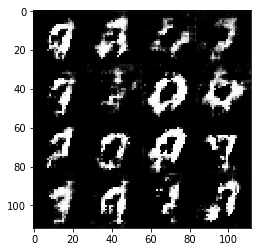

Epoch 0/2... Discriminator Loss: 1.3376... Generator Loss: 0.7937
Epoch 0/2... Discriminator Loss: 1.3798... Generator Loss: 0.8374
Epoch 0/2... Discriminator Loss: 1.3586... Generator Loss: 0.8012
Epoch 0/2... Discriminator Loss: 1.3790... Generator Loss: 0.9147
Epoch 0/2... Discriminator Loss: 1.3840... Generator Loss: 0.8003


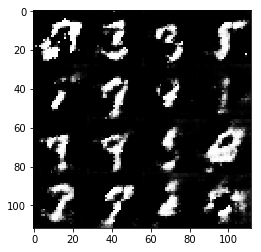

Epoch 0/2... Discriminator Loss: 1.4465... Generator Loss: 0.8665
Epoch 0/2... Discriminator Loss: 1.3227... Generator Loss: 0.8180
Epoch 0/2... Discriminator Loss: 1.4913... Generator Loss: 0.7084
Epoch 0/2... Discriminator Loss: 1.4576... Generator Loss: 0.6523
Epoch 0/2... Discriminator Loss: 1.4185... Generator Loss: 0.7090


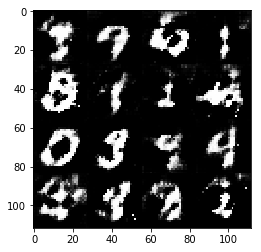

Epoch 0/2... Discriminator Loss: 1.4519... Generator Loss: 0.8316
Epoch 0/2... Discriminator Loss: 1.3829... Generator Loss: 0.8206
Epoch 0/2... Discriminator Loss: 1.3395... Generator Loss: 0.7806
Epoch 0/2... Discriminator Loss: 1.5598... Generator Loss: 0.6827
Epoch 0/2... Discriminator Loss: 1.3947... Generator Loss: 0.8419


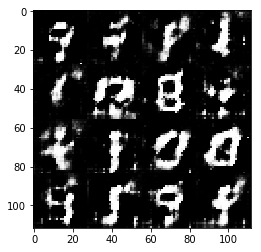

Epoch 0/2... Discriminator Loss: 1.4570... Generator Loss: 0.8504
Epoch 0/2... Discriminator Loss: 1.3605... Generator Loss: 0.8635
Epoch 0/2... Discriminator Loss: 1.3535... Generator Loss: 0.7992
Epoch 0/2... Discriminator Loss: 1.4433... Generator Loss: 0.7526
Epoch 0/2... Discriminator Loss: 1.5116... Generator Loss: 0.8681


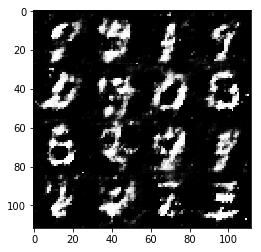

Epoch 0/2... Discriminator Loss: 1.2778... Generator Loss: 0.8558
Epoch 0/2... Discriminator Loss: 1.4524... Generator Loss: 0.6883
Epoch 0/2... Discriminator Loss: 1.3973... Generator Loss: 0.8086
Epoch 0/2... Discriminator Loss: 1.3620... Generator Loss: 0.8617
Epoch 0/2... Discriminator Loss: 1.3784... Generator Loss: 0.8456


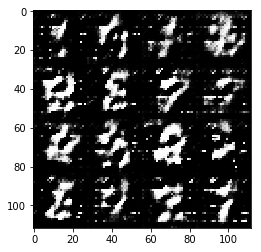

Epoch 0/2... Discriminator Loss: 1.4217... Generator Loss: 0.9329
Epoch 0/2... Discriminator Loss: 1.3921... Generator Loss: 0.8023
Epoch 0/2... Discriminator Loss: 1.4061... Generator Loss: 0.8181
Epoch 0/2... Discriminator Loss: 1.4033... Generator Loss: 0.7125
Epoch 0/2... Discriminator Loss: 1.4501... Generator Loss: 0.7940


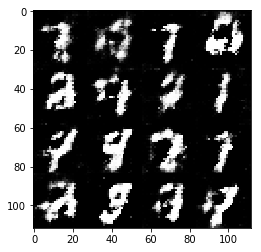

Epoch 0/2... Discriminator Loss: 1.3170... Generator Loss: 0.8787
Epoch 0/2... Discriminator Loss: 1.3840... Generator Loss: 0.8133
Epoch 0/2... Discriminator Loss: 1.3580... Generator Loss: 0.7472
Epoch 0/2... Discriminator Loss: 1.4592... Generator Loss: 0.7748
Epoch 0/2... Discriminator Loss: 1.3742... Generator Loss: 0.7503


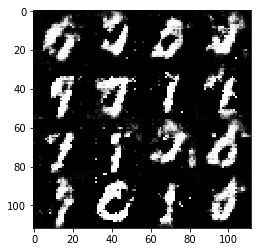

Epoch 0/2... Discriminator Loss: 1.4389... Generator Loss: 0.8269
Epoch 0/2... Discriminator Loss: 1.5146... Generator Loss: 0.7038
Epoch 0/2... Discriminator Loss: 1.3925... Generator Loss: 0.8297
Epoch 0/2... Discriminator Loss: 1.3365... Generator Loss: 0.8196
Epoch 0/2... Discriminator Loss: 1.3745... Generator Loss: 0.7677


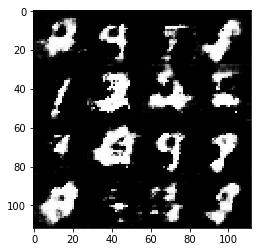

Epoch 0/2... Discriminator Loss: 1.3921... Generator Loss: 0.8776
Epoch 0/2... Discriminator Loss: 1.4298... Generator Loss: 0.7519
Epoch 0/2... Discriminator Loss: 1.4403... Generator Loss: 0.8183
Epoch 0/2... Discriminator Loss: 1.4653... Generator Loss: 0.8167
Epoch 0/2... Discriminator Loss: 1.3287... Generator Loss: 0.7664


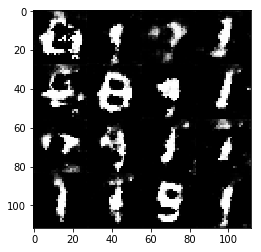

Epoch 0/2... Discriminator Loss: 1.4094... Generator Loss: 0.7802
Epoch 0/2... Discriminator Loss: 1.3840... Generator Loss: 0.7843
Epoch 0/2... Discriminator Loss: 1.4266... Generator Loss: 0.7829
Epoch 0/2... Discriminator Loss: 1.4263... Generator Loss: 0.8211
Epoch 0/2... Discriminator Loss: 1.4182... Generator Loss: 0.7614


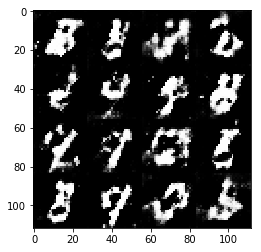

Epoch 0/2... Discriminator Loss: 1.3113... Generator Loss: 0.8621
Epoch 0/2... Discriminator Loss: 1.4046... Generator Loss: 0.8201
Epoch 0/2... Discriminator Loss: 1.4287... Generator Loss: 0.7344
Epoch 0/2... Discriminator Loss: 1.4121... Generator Loss: 0.8970
Epoch 0/2... Discriminator Loss: 1.3366... Generator Loss: 0.7890


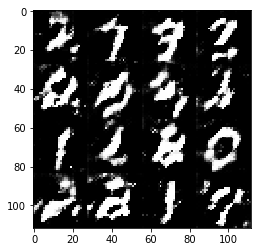

Epoch 0/2... Discriminator Loss: 1.3712... Generator Loss: 0.7266
Epoch 0/2... Discriminator Loss: 1.4889... Generator Loss: 0.7680
Epoch 0/2... Discriminator Loss: 1.4269... Generator Loss: 0.7726
Epoch 0/2... Discriminator Loss: 1.4166... Generator Loss: 0.8797
Epoch 0/2... Discriminator Loss: 1.4039... Generator Loss: 0.8195


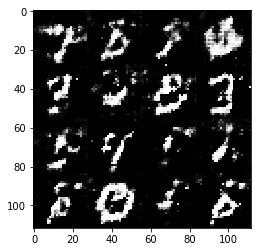

Epoch 0/2... Discriminator Loss: 1.3528... Generator Loss: 0.8248
Epoch 0/2... Discriminator Loss: 1.4709... Generator Loss: 0.7185
Epoch 0/2... Discriminator Loss: 1.3887... Generator Loss: 0.9074
Epoch 0/2... Discriminator Loss: 1.4781... Generator Loss: 0.7688
Epoch 0/2... Discriminator Loss: 1.3976... Generator Loss: 0.7333


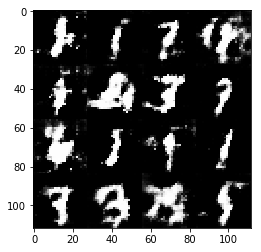

Epoch 0/2... Discriminator Loss: 1.4359... Generator Loss: 0.7098
Epoch 0/2... Discriminator Loss: 1.4658... Generator Loss: 0.7637
Epoch 0/2... Discriminator Loss: 1.3763... Generator Loss: 0.8605
Epoch 0/2... Discriminator Loss: 1.3864... Generator Loss: 0.7639
Epoch 0/2... Discriminator Loss: 1.5429... Generator Loss: 0.7357


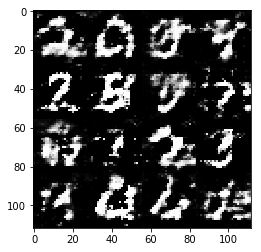

Epoch 1/2... Discriminator Loss: 1.3489... Generator Loss: 0.8057
Epoch 1/2... Discriminator Loss: 1.3595... Generator Loss: 0.8076
Epoch 1/2... Discriminator Loss: 1.4180... Generator Loss: 0.7559
Epoch 1/2... Discriminator Loss: 1.4429... Generator Loss: 0.8133
Epoch 1/2... Discriminator Loss: 1.3791... Generator Loss: 0.8140


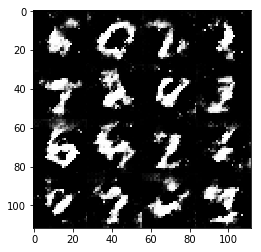

Epoch 1/2... Discriminator Loss: 1.4484... Generator Loss: 0.7718
Epoch 1/2... Discriminator Loss: 1.3680... Generator Loss: 0.7643
Epoch 1/2... Discriminator Loss: 1.4629... Generator Loss: 0.7596
Epoch 1/2... Discriminator Loss: 1.3651... Generator Loss: 0.7847
Epoch 1/2... Discriminator Loss: 1.3704... Generator Loss: 0.7912


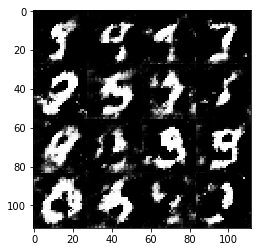

Epoch 1/2... Discriminator Loss: 1.3776... Generator Loss: 0.7448
Epoch 1/2... Discriminator Loss: 1.3730... Generator Loss: 0.7824
Epoch 1/2... Discriminator Loss: 1.4971... Generator Loss: 0.7511
Epoch 1/2... Discriminator Loss: 1.4110... Generator Loss: 0.7920
Epoch 1/2... Discriminator Loss: 1.4302... Generator Loss: 0.7582


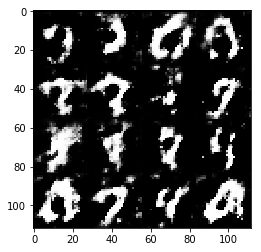

Epoch 1/2... Discriminator Loss: 1.5198... Generator Loss: 0.6462
Epoch 1/2... Discriminator Loss: 1.4279... Generator Loss: 0.7841
Epoch 1/2... Discriminator Loss: 1.4905... Generator Loss: 0.7535
Epoch 1/2... Discriminator Loss: 1.3460... Generator Loss: 0.8079
Epoch 1/2... Discriminator Loss: 1.4567... Generator Loss: 0.7379


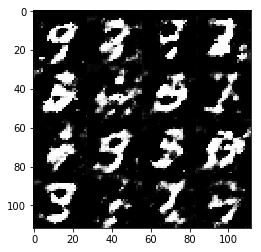

Epoch 1/2... Discriminator Loss: 1.3750... Generator Loss: 0.7546
Epoch 1/2... Discriminator Loss: 1.5536... Generator Loss: 0.6623
Epoch 1/2... Discriminator Loss: 1.3319... Generator Loss: 0.7929
Epoch 1/2... Discriminator Loss: 1.4300... Generator Loss: 0.8211
Epoch 1/2... Discriminator Loss: 1.3718... Generator Loss: 0.8037


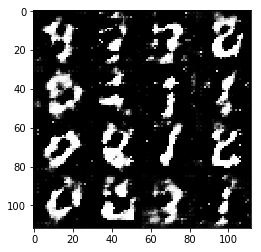

Epoch 1/2... Discriminator Loss: 1.4142... Generator Loss: 0.7798
Epoch 1/2... Discriminator Loss: 1.4006... Generator Loss: 0.7703
Epoch 1/2... Discriminator Loss: 1.4176... Generator Loss: 0.8010
Epoch 1/2... Discriminator Loss: 1.3565... Generator Loss: 0.8159
Epoch 1/2... Discriminator Loss: 1.4017... Generator Loss: 0.8000


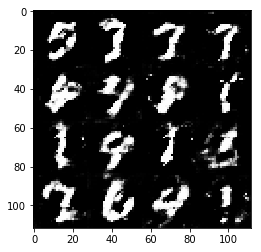

Epoch 1/2... Discriminator Loss: 1.3954... Generator Loss: 0.7740
Epoch 1/2... Discriminator Loss: 1.4063... Generator Loss: 0.7615
Epoch 1/2... Discriminator Loss: 1.3250... Generator Loss: 0.8164
Epoch 1/2... Discriminator Loss: 1.4383... Generator Loss: 0.7706
Epoch 1/2... Discriminator Loss: 1.5042... Generator Loss: 0.6990


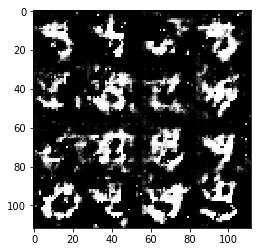

Epoch 1/2... Discriminator Loss: 1.4176... Generator Loss: 0.7837
Epoch 1/2... Discriminator Loss: 1.3814... Generator Loss: 0.7755
Epoch 1/2... Discriminator Loss: 1.3501... Generator Loss: 0.7957
Epoch 1/2... Discriminator Loss: 1.4038... Generator Loss: 0.7566
Epoch 1/2... Discriminator Loss: 1.3749... Generator Loss: 0.8140


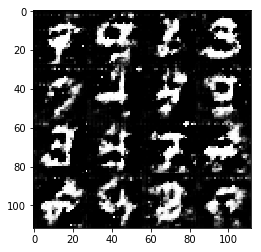

Epoch 1/2... Discriminator Loss: 1.4200... Generator Loss: 0.7624
Epoch 1/2... Discriminator Loss: 1.3479... Generator Loss: 0.8200
Epoch 1/2... Discriminator Loss: 1.4693... Generator Loss: 0.6792
Epoch 1/2... Discriminator Loss: 1.4171... Generator Loss: 0.7224
Epoch 1/2... Discriminator Loss: 1.4054... Generator Loss: 0.8333


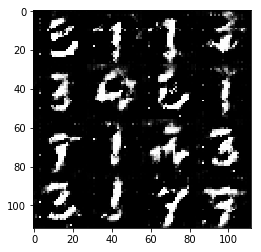

Epoch 1/2... Discriminator Loss: 1.3722... Generator Loss: 0.7997
Epoch 1/2... Discriminator Loss: 1.5303... Generator Loss: 0.6966
Epoch 1/2... Discriminator Loss: 1.3556... Generator Loss: 0.7791
Epoch 1/2... Discriminator Loss: 1.3852... Generator Loss: 0.8026
Epoch 1/2... Discriminator Loss: 1.4264... Generator Loss: 0.7940


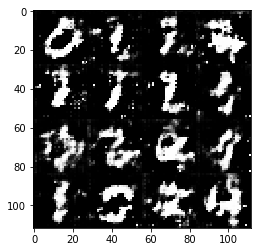

Epoch 1/2... Discriminator Loss: 1.3392... Generator Loss: 0.8021
Epoch 1/2... Discriminator Loss: 1.3748... Generator Loss: 0.7698
Epoch 1/2... Discriminator Loss: 1.3918... Generator Loss: 0.7697
Epoch 1/2... Discriminator Loss: 1.3735... Generator Loss: 0.7880
Epoch 1/2... Discriminator Loss: 1.3786... Generator Loss: 0.8018


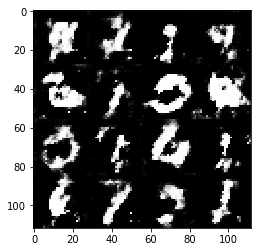

Epoch 1/2... Discriminator Loss: 1.3713... Generator Loss: 0.7665
Epoch 1/2... Discriminator Loss: 1.4222... Generator Loss: 0.7896
Epoch 1/2... Discriminator Loss: 1.3772... Generator Loss: 0.8121
Epoch 1/2... Discriminator Loss: 1.3808... Generator Loss: 0.7658
Epoch 1/2... Discriminator Loss: 1.3775... Generator Loss: 0.7791


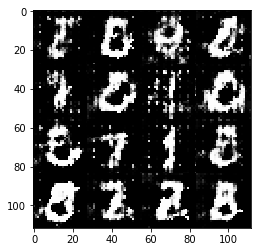

Epoch 1/2... Discriminator Loss: 1.3813... Generator Loss: 0.7919
Epoch 1/2... Discriminator Loss: 1.3823... Generator Loss: 0.7616
Epoch 1/2... Discriminator Loss: 1.3951... Generator Loss: 0.8255
Epoch 1/2... Discriminator Loss: 1.4063... Generator Loss: 0.8003
Epoch 1/2... Discriminator Loss: 1.3990... Generator Loss: 0.7620


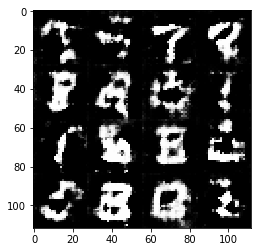

Epoch 1/2... Discriminator Loss: 1.3703... Generator Loss: 0.7784
Epoch 1/2... Discriminator Loss: 1.4428... Generator Loss: 0.7452
Epoch 1/2... Discriminator Loss: 1.3884... Generator Loss: 0.7860
Epoch 1/2... Discriminator Loss: 1.3954... Generator Loss: 0.7847
Epoch 1/2... Discriminator Loss: 1.3618... Generator Loss: 0.8042


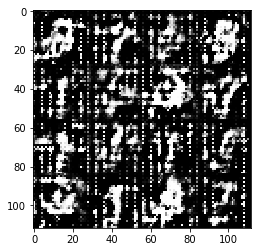

Epoch 1/2... Discriminator Loss: 1.3837... Generator Loss: 0.7747
Epoch 1/2... Discriminator Loss: 1.3893... Generator Loss: 0.7671
Epoch 1/2... Discriminator Loss: 1.4074... Generator Loss: 0.8004
Epoch 1/2... Discriminator Loss: 1.3862... Generator Loss: 0.7680
Epoch 1/2... Discriminator Loss: 1.4661... Generator Loss: 0.7393


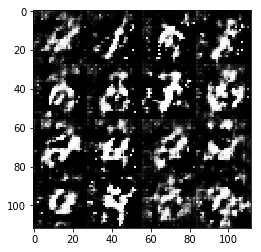

Epoch 1/2... Discriminator Loss: 1.4179... Generator Loss: 0.7575
Epoch 1/2... Discriminator Loss: 1.4034... Generator Loss: 0.7781
Epoch 1/2... Discriminator Loss: 1.3979... Generator Loss: 0.8052
Epoch 1/2... Discriminator Loss: 1.3804... Generator Loss: 0.8020
Epoch 1/2... Discriminator Loss: 1.4145... Generator Loss: 0.7779


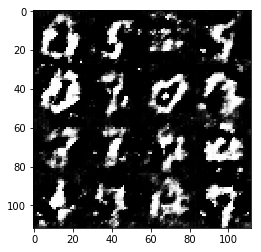

Epoch 1/2... Discriminator Loss: 1.3464... Generator Loss: 0.7872
Epoch 1/2... Discriminator Loss: 1.3849... Generator Loss: 0.7957
Epoch 1/2... Discriminator Loss: 1.3886... Generator Loss: 0.7921
Epoch 1/2... Discriminator Loss: 1.3512... Generator Loss: 0.8178
Epoch 1/2... Discriminator Loss: 1.4059... Generator Loss: 0.7634


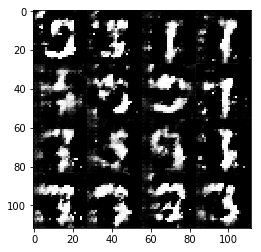

Epoch 1/2... Discriminator Loss: 1.3961... Generator Loss: 0.7901
Epoch 1/2... Discriminator Loss: 1.3691... Generator Loss: 0.7947
Epoch 1/2... Discriminator Loss: 1.3340... Generator Loss: 0.8116
Epoch 1/2... Discriminator Loss: 1.4011... Generator Loss: 0.8053
Epoch 1/2... Discriminator Loss: 1.3849... Generator Loss: 0.7945


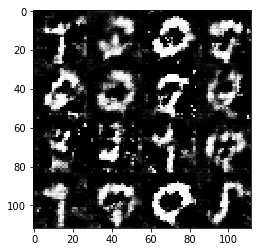

Epoch 1/2... Discriminator Loss: 1.4174... Generator Loss: 0.7769
Epoch 1/2... Discriminator Loss: 1.3643... Generator Loss: 0.8061
Epoch 1/2... Discriminator Loss: 1.3880... Generator Loss: 0.8013
Epoch 1/2... Discriminator Loss: 1.3616... Generator Loss: 0.8091
Epoch 1/2... Discriminator Loss: 1.4040... Generator Loss: 0.7949


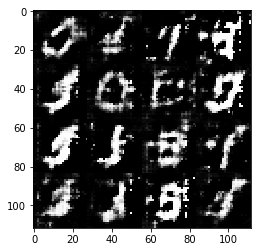

Epoch 1/2... Discriminator Loss: 1.4532... Generator Loss: 0.7827
Epoch 1/2... Discriminator Loss: 1.3898... Generator Loss: 0.7553
Epoch 1/2... Discriminator Loss: 1.3724... Generator Loss: 0.7731
Epoch 1/2... Discriminator Loss: 1.3691... Generator Loss: 0.8192
Epoch 1/2... Discriminator Loss: 1.4207... Generator Loss: 0.7634


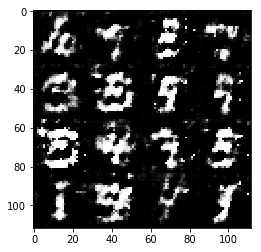

Epoch 1/2... Discriminator Loss: 1.3748... Generator Loss: 0.7976
Epoch 1/2... Discriminator Loss: 1.3597... Generator Loss: 0.8116
Epoch 1/2... Discriminator Loss: 1.4046... Generator Loss: 0.7934
Epoch 1/2... Discriminator Loss: 1.3966... Generator Loss: 0.8015
Epoch 1/2... Discriminator Loss: 1.4169... Generator Loss: 0.7635


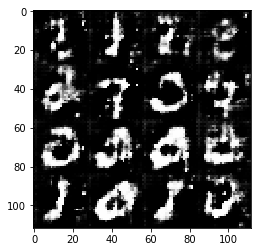

Epoch 1/2... Discriminator Loss: 1.3906... Generator Loss: 0.8103
Epoch 1/2... Discriminator Loss: 1.3736... Generator Loss: 0.7954
Epoch 1/2... Discriminator Loss: 1.3824... Generator Loss: 0.7940
Epoch 1/2... Discriminator Loss: 1.4140... Generator Loss: 0.7940
Epoch 1/2... Discriminator Loss: 1.3677... Generator Loss: 0.8137


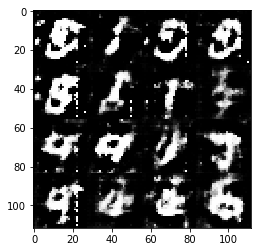

Epoch 1/2... Discriminator Loss: 1.3865... Generator Loss: 0.8162
Epoch 1/2... Discriminator Loss: 1.3743... Generator Loss: 0.8225
Epoch 1/2... Discriminator Loss: 1.3910... Generator Loss: 0.8062
Epoch 1/2... Discriminator Loss: 1.3995... Generator Loss: 0.7809
Epoch 1/2... Discriminator Loss: 1.3692... Generator Loss: 0.8024


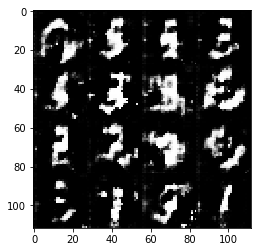

Epoch 1/2... Discriminator Loss: 1.3597... Generator Loss: 0.8104
Epoch 1/2... Discriminator Loss: 1.4287... Generator Loss: 0.7627
Epoch 1/2... Discriminator Loss: 1.3730... Generator Loss: 0.8186
Epoch 1/2... Discriminator Loss: 1.4170... Generator Loss: 0.7857
Epoch 1/2... Discriminator Loss: 1.4040... Generator Loss: 0.7827


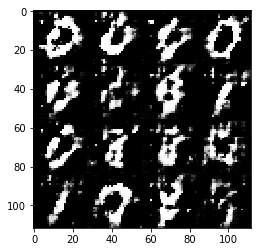

Epoch 1/2... Discriminator Loss: 1.4174... Generator Loss: 0.7698
Epoch 1/2... Discriminator Loss: 1.3702... Generator Loss: 0.7861
Epoch 1/2... Discriminator Loss: 1.4321... Generator Loss: 0.7914
Epoch 1/2... Discriminator Loss: 1.3886... Generator Loss: 0.8302
Epoch 1/2... Discriminator Loss: 1.4097... Generator Loss: 0.7606


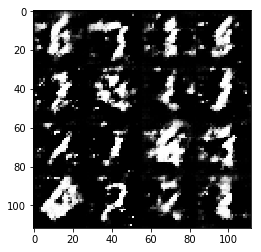

Epoch 1/2... Discriminator Loss: 1.3942... Generator Loss: 0.8097
Epoch 1/2... Discriminator Loss: 1.3871... Generator Loss: 0.7643
Epoch 1/2... Discriminator Loss: 1.3591... Generator Loss: 0.8030
Epoch 1/2... Discriminator Loss: 1.3788... Generator Loss: 0.7931
Epoch 1/2... Discriminator Loss: 1.3901... Generator Loss: 0.8144


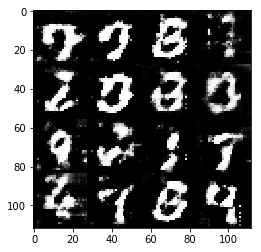

Epoch 1/2... Discriminator Loss: 1.3836... Generator Loss: 0.7909
Epoch 1/2... Discriminator Loss: 1.3744... Generator Loss: 0.7940
Epoch 1/2... Discriminator Loss: 1.3628... Generator Loss: 0.8115
Epoch 1/2... Discriminator Loss: 1.4056... Generator Loss: 0.7855
Epoch 1/2... Discriminator Loss: 1.3920... Generator Loss: 0.7854


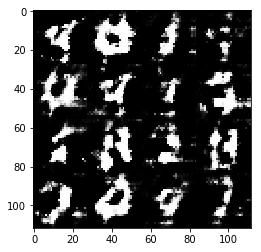

Epoch 1/2... Discriminator Loss: 1.3808... Generator Loss: 0.7966
Epoch 1/2... Discriminator Loss: 1.4065... Generator Loss: 0.8149
Epoch 1/2... Discriminator Loss: 1.3984... Generator Loss: 0.7902
Epoch 1/2... Discriminator Loss: 1.3679... Generator Loss: 0.8406
Epoch 1/2... Discriminator Loss: 1.3903... Generator Loss: 0.7767


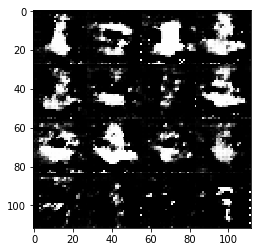

Epoch 1/2... Discriminator Loss: 1.3829... Generator Loss: 0.8136
Epoch 1/2... Discriminator Loss: 1.3816... Generator Loss: 0.7967
Epoch 1/2... Discriminator Loss: 1.3931... Generator Loss: 0.7735
Epoch 1/2... Discriminator Loss: 1.3932... Generator Loss: 0.7846
Epoch 1/2... Discriminator Loss: 1.3907... Generator Loss: 0.8026


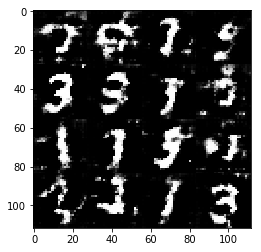

Epoch 1/2... Discriminator Loss: 1.3779... Generator Loss: 0.7838
Epoch 1/2... Discriminator Loss: 1.3948... Generator Loss: 0.7808
Epoch 1/2... Discriminator Loss: 1.3520... Generator Loss: 0.8168
Epoch 1/2... Discriminator Loss: 1.3808... Generator Loss: 0.7779
Epoch 1/2... Discriminator Loss: 1.3727... Generator Loss: 0.8102


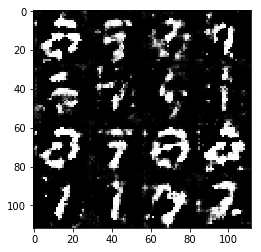

Epoch 1/2... Discriminator Loss: 1.4075... Generator Loss: 0.7637
Epoch 1/2... Discriminator Loss: 1.3488... Generator Loss: 0.7978
Epoch 1/2... Discriminator Loss: 1.4157... Generator Loss: 0.8113
Epoch 1/2... Discriminator Loss: 1.3413... Generator Loss: 0.8086
Epoch 1/2... Discriminator Loss: 1.3689... Generator Loss: 0.8232


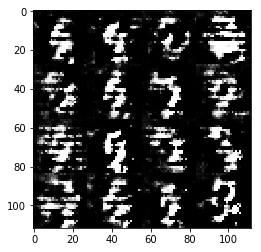

Epoch 1/2... Discriminator Loss: 1.3675... Generator Loss: 0.8097
Epoch 1/2... Discriminator Loss: 1.3812... Generator Loss: 0.7687
Epoch 1/2... Discriminator Loss: 1.3672... Generator Loss: 0.8146
Epoch 1/2... Discriminator Loss: 1.4572... Generator Loss: 0.7378
Epoch 1/2... Discriminator Loss: 1.3708... Generator Loss: 0.7993


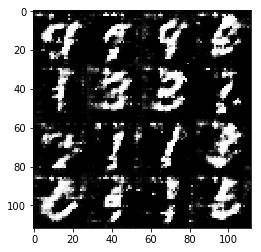

Epoch 1/2... Discriminator Loss: 1.3724... Generator Loss: 0.8174
Epoch 1/2... Discriminator Loss: 1.3883... Generator Loss: 0.8207
Epoch 1/2... Discriminator Loss: 1.4015... Generator Loss: 0.7727
Epoch 1/2... Discriminator Loss: 1.3937... Generator Loss: 0.7767
Epoch 1/2... Discriminator Loss: 1.3791... Generator Loss: 0.8028


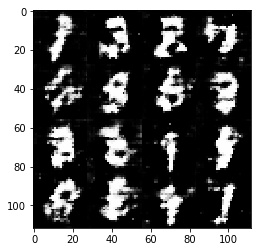

Epoch 1/2... Discriminator Loss: 1.3837... Generator Loss: 0.8036
Epoch 1/2... Discriminator Loss: 1.3991... Generator Loss: 0.7658
Epoch 1/2... Discriminator Loss: 1.3885... Generator Loss: 0.7973
Epoch 1/2... Discriminator Loss: 1.3787... Generator Loss: 0.7968
Epoch 1/2... Discriminator Loss: 1.3734... Generator Loss: 0.7871


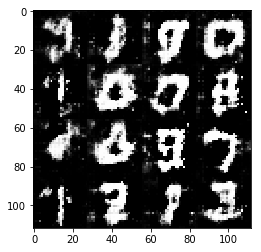

Epoch 1/2... Discriminator Loss: 1.3742... Generator Loss: 0.7880
Epoch 1/2... Discriminator Loss: 1.3652... Generator Loss: 0.7742
Epoch 1/2... Discriminator Loss: 1.3739... Generator Loss: 0.7868
Epoch 1/2... Discriminator Loss: 1.4137... Generator Loss: 0.7767
Epoch 1/2... Discriminator Loss: 1.4178... Generator Loss: 0.7712


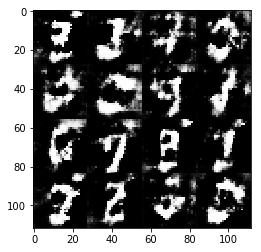

Epoch 1/2... Discriminator Loss: 1.3792... Generator Loss: 0.7835
Epoch 1/2... Discriminator Loss: 1.3889... Generator Loss: 0.8048
Epoch 1/2... Discriminator Loss: 1.3661... Generator Loss: 0.7801
Epoch 1/2... Discriminator Loss: 1.3608... Generator Loss: 0.8007
Epoch 1/2... Discriminator Loss: 1.3768... Generator Loss: 0.7745


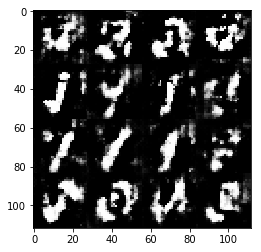

Epoch 1/2... Discriminator Loss: 1.3601... Generator Loss: 0.8149
Epoch 1/2... Discriminator Loss: 1.3793... Generator Loss: 0.8131
Epoch 1/2... Discriminator Loss: 1.4784... Generator Loss: 0.6867
Epoch 1/2... Discriminator Loss: 1.3916... Generator Loss: 0.7955
Epoch 1/2... Discriminator Loss: 1.3823... Generator Loss: 0.8074


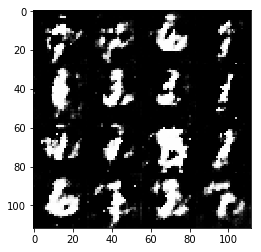

Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.7749
Epoch 1/2... Discriminator Loss: 1.3754... Generator Loss: 0.7888
Epoch 1/2... Discriminator Loss: 1.3902... Generator Loss: 0.7897
Epoch 1/2... Discriminator Loss: 1.3744... Generator Loss: 0.7968
Epoch 1/2... Discriminator Loss: 1.3640... Generator Loss: 0.8076


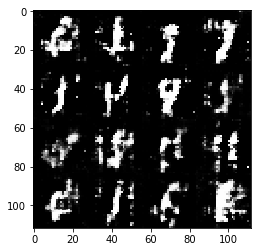

Epoch 1/2... Discriminator Loss: 1.3720... Generator Loss: 0.7916
Epoch 1/2... Discriminator Loss: 1.3810... Generator Loss: 0.7915
Epoch 1/2... Discriminator Loss: 1.3892... Generator Loss: 0.7961
Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.7914
Epoch 1/2... Discriminator Loss: 1.3724... Generator Loss: 0.7751


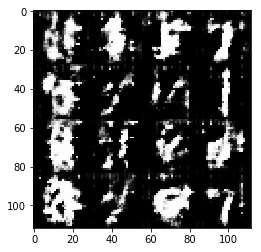

Epoch 1/2... Discriminator Loss: 1.3785... Generator Loss: 0.8079
Epoch 1/2... Discriminator Loss: 1.3722... Generator Loss: 0.7843
Epoch 1/2... Discriminator Loss: 1.3717... Generator Loss: 0.8082
Epoch 1/2... Discriminator Loss: 1.3833... Generator Loss: 0.7922
Epoch 1/2... Discriminator Loss: 1.3723... Generator Loss: 0.8101


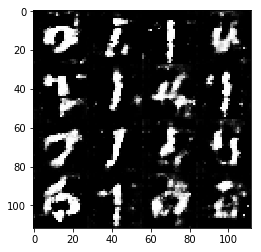

In [13]:
batch_size = 30
z_dim = 100
learning_rate = 0.004
beta1 = 0.5



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0/2... Discriminator Loss: 0.6741... Generator Loss: 2.0450
Epoch 0/2... Discriminator Loss: 0.9286... Generator Loss: 1.0979
Epoch 0/2... Discriminator Loss: 1.0050... Generator Loss: 1.0318
Epoch 0/2... Discriminator Loss: 0.6400... Generator Loss: 1.5564
Epoch 0/2... Discriminator Loss: 0.6973... Generator Loss: 1.5411


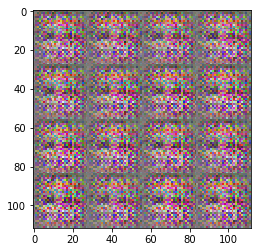

Epoch 0/2... Discriminator Loss: 0.7601... Generator Loss: 1.7026
Epoch 0/2... Discriminator Loss: 0.9237... Generator Loss: 1.1846
Epoch 0/2... Discriminator Loss: 1.6886... Generator Loss: 1.0002
Epoch 0/2... Discriminator Loss: 1.3698... Generator Loss: 1.1483
Epoch 0/2... Discriminator Loss: 1.4557... Generator Loss: 1.3953


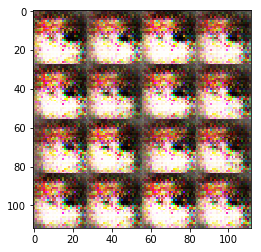

Epoch 0/2... Discriminator Loss: 0.8192... Generator Loss: 1.3678
Epoch 0/2... Discriminator Loss: 1.5618... Generator Loss: 1.2614
Epoch 0/2... Discriminator Loss: 0.6703... Generator Loss: 1.6938
Epoch 0/2... Discriminator Loss: 0.7509... Generator Loss: 2.5792
Epoch 0/2... Discriminator Loss: 0.7501... Generator Loss: 2.4283


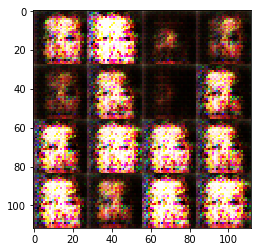

Epoch 0/2... Discriminator Loss: 0.6593... Generator Loss: 1.8221
Epoch 0/2... Discriminator Loss: 0.7680... Generator Loss: 1.4825
Epoch 0/2... Discriminator Loss: 0.8881... Generator Loss: 1.4339
Epoch 0/2... Discriminator Loss: 0.6278... Generator Loss: 2.0343
Epoch 0/2... Discriminator Loss: 0.6554... Generator Loss: 1.7920


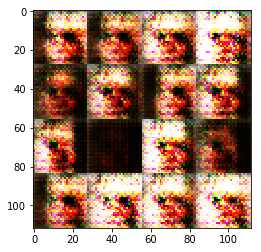

Epoch 0/2... Discriminator Loss: 0.5825... Generator Loss: 1.7965
Epoch 0/2... Discriminator Loss: 0.8639... Generator Loss: 1.3202
Epoch 0/2... Discriminator Loss: 0.7677... Generator Loss: 2.0760
Epoch 0/2... Discriminator Loss: 0.7582... Generator Loss: 1.5831
Epoch 0/2... Discriminator Loss: 0.7264... Generator Loss: 2.1715


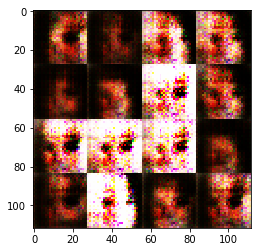

Epoch 0/2... Discriminator Loss: 0.8567... Generator Loss: 1.7095
Epoch 0/2... Discriminator Loss: 1.1969... Generator Loss: 0.6510
Epoch 0/2... Discriminator Loss: 0.9344... Generator Loss: 1.3469
Epoch 0/2... Discriminator Loss: 1.2209... Generator Loss: 0.9599
Epoch 0/2... Discriminator Loss: 1.1551... Generator Loss: 2.0911


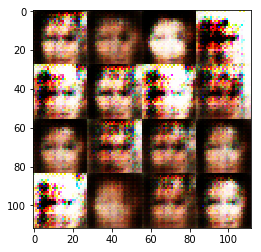

Epoch 0/2... Discriminator Loss: 1.0750... Generator Loss: 1.2343
Epoch 0/2... Discriminator Loss: 1.1507... Generator Loss: 0.8534
Epoch 0/2... Discriminator Loss: 0.9697... Generator Loss: 1.3187
Epoch 0/2... Discriminator Loss: 1.4493... Generator Loss: 0.8503
Epoch 0/2... Discriminator Loss: 0.9544... Generator Loss: 1.2747


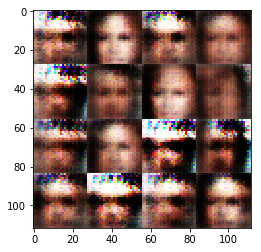

Epoch 0/2... Discriminator Loss: 1.1223... Generator Loss: 1.1465
Epoch 0/2... Discriminator Loss: 1.1408... Generator Loss: 1.2086
Epoch 0/2... Discriminator Loss: 1.2474... Generator Loss: 0.8165
Epoch 0/2... Discriminator Loss: 1.0958... Generator Loss: 1.0103
Epoch 0/2... Discriminator Loss: 1.2916... Generator Loss: 1.1091


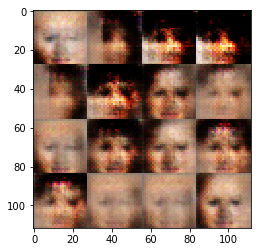

Epoch 0/2... Discriminator Loss: 1.0203... Generator Loss: 1.0335
Epoch 0/2... Discriminator Loss: 1.1069... Generator Loss: 1.0697
Epoch 0/2... Discriminator Loss: 1.2935... Generator Loss: 0.9874
Epoch 0/2... Discriminator Loss: 1.1511... Generator Loss: 1.0450
Epoch 0/2... Discriminator Loss: 1.1720... Generator Loss: 1.0320


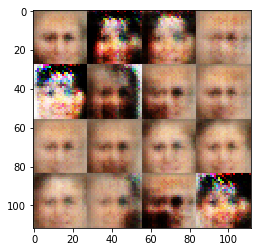

Epoch 0/2... Discriminator Loss: 1.2862... Generator Loss: 0.7499
Epoch 0/2... Discriminator Loss: 1.4607... Generator Loss: 0.8895
Epoch 0/2... Discriminator Loss: 1.1164... Generator Loss: 1.0600
Epoch 0/2... Discriminator Loss: 1.2489... Generator Loss: 0.9880
Epoch 0/2... Discriminator Loss: 1.0263... Generator Loss: 1.1736


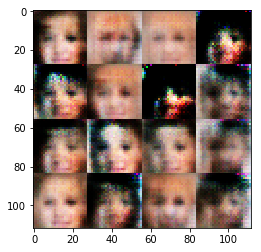

Epoch 0/2... Discriminator Loss: 1.2028... Generator Loss: 0.9935
Epoch 0/2... Discriminator Loss: 1.1001... Generator Loss: 0.9811
Epoch 0/2... Discriminator Loss: 1.2404... Generator Loss: 0.9778
Epoch 0/2... Discriminator Loss: 1.5528... Generator Loss: 1.1738
Epoch 0/2... Discriminator Loss: 1.1947... Generator Loss: 0.8857


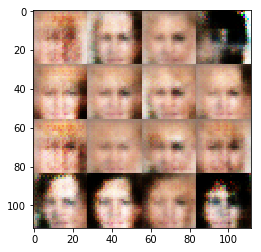

Epoch 0/2... Discriminator Loss: 1.0633... Generator Loss: 1.2336
Epoch 0/2... Discriminator Loss: 1.1021... Generator Loss: 1.0113
Epoch 0/2... Discriminator Loss: 0.9892... Generator Loss: 1.2112
Epoch 0/2... Discriminator Loss: 1.3220... Generator Loss: 1.1076
Epoch 0/2... Discriminator Loss: 0.9435... Generator Loss: 1.1269


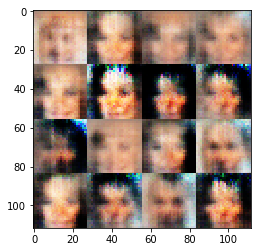

Epoch 0/2... Discriminator Loss: 0.9522... Generator Loss: 1.4782
Epoch 0/2... Discriminator Loss: 1.0849... Generator Loss: 1.0356
Epoch 0/2... Discriminator Loss: 1.0866... Generator Loss: 0.9897
Epoch 0/2... Discriminator Loss: 1.0610... Generator Loss: 1.1124
Epoch 0/2... Discriminator Loss: 1.0466... Generator Loss: 1.2853


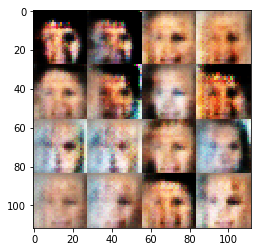

Epoch 0/2... Discriminator Loss: 1.0827... Generator Loss: 0.9446
Epoch 0/2... Discriminator Loss: 1.1297... Generator Loss: 1.1158
Epoch 0/2... Discriminator Loss: 1.0436... Generator Loss: 1.3534
Epoch 0/2... Discriminator Loss: 1.2001... Generator Loss: 1.2249
Epoch 0/2... Discriminator Loss: 1.0825... Generator Loss: 1.2284


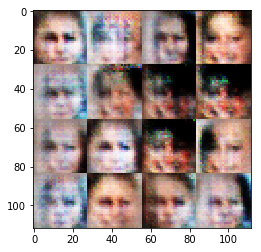

Epoch 0/2... Discriminator Loss: 1.0572... Generator Loss: 1.2268
Epoch 0/2... Discriminator Loss: 1.1930... Generator Loss: 1.5199
Epoch 0/2... Discriminator Loss: 1.1182... Generator Loss: 1.0490
Epoch 0/2... Discriminator Loss: 1.4387... Generator Loss: 1.0783
Epoch 0/2... Discriminator Loss: 1.1855... Generator Loss: 1.0459


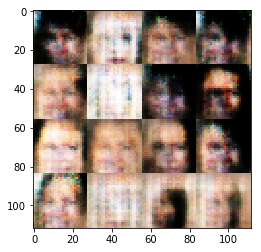

Epoch 0/2... Discriminator Loss: 1.4380... Generator Loss: 0.9766
Epoch 0/2... Discriminator Loss: 1.3575... Generator Loss: 0.8439
Epoch 0/2... Discriminator Loss: 1.3070... Generator Loss: 0.8010
Epoch 0/2... Discriminator Loss: 1.7143... Generator Loss: 0.7252
Epoch 0/2... Discriminator Loss: 1.5256... Generator Loss: 0.9957


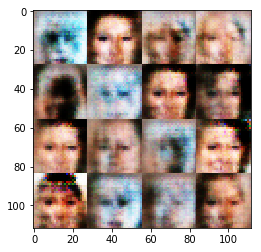

Epoch 0/2... Discriminator Loss: 1.2418... Generator Loss: 0.8234
Epoch 0/2... Discriminator Loss: 1.2784... Generator Loss: 0.8819
Epoch 0/2... Discriminator Loss: 1.3697... Generator Loss: 1.1887
Epoch 0/2... Discriminator Loss: 1.4153... Generator Loss: 0.9415
Epoch 0/2... Discriminator Loss: 1.0346... Generator Loss: 1.0165


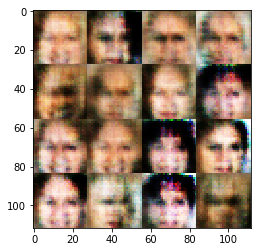

Epoch 0/2... Discriminator Loss: 1.2100... Generator Loss: 0.9876
Epoch 0/2... Discriminator Loss: 1.5449... Generator Loss: 0.7707
Epoch 0/2... Discriminator Loss: 1.3562... Generator Loss: 0.6852
Epoch 0/2... Discriminator Loss: 1.3815... Generator Loss: 1.2481
Epoch 0/2... Discriminator Loss: 1.4292... Generator Loss: 0.9801


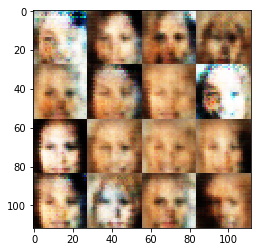

Epoch 0/2... Discriminator Loss: 1.1734... Generator Loss: 1.1257
Epoch 0/2... Discriminator Loss: 1.4669... Generator Loss: 0.6784
Epoch 0/2... Discriminator Loss: 1.1506... Generator Loss: 1.2443
Epoch 0/2... Discriminator Loss: 1.0981... Generator Loss: 1.0603
Epoch 0/2... Discriminator Loss: 1.5442... Generator Loss: 0.8972


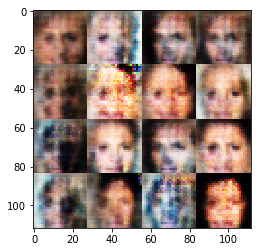

Epoch 0/2... Discriminator Loss: 1.3590... Generator Loss: 0.9529
Epoch 0/2... Discriminator Loss: 1.3569... Generator Loss: 0.9260
Epoch 0/2... Discriminator Loss: 1.4910... Generator Loss: 0.8188
Epoch 0/2... Discriminator Loss: 1.6061... Generator Loss: 0.7315
Epoch 0/2... Discriminator Loss: 1.4391... Generator Loss: 1.1125


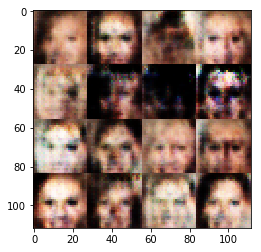

Epoch 0/2... Discriminator Loss: 1.1911... Generator Loss: 1.0220
Epoch 0/2... Discriminator Loss: 1.5016... Generator Loss: 0.9099
Epoch 0/2... Discriminator Loss: 1.1358... Generator Loss: 1.1486
Epoch 0/2... Discriminator Loss: 1.1075... Generator Loss: 1.4297
Epoch 0/2... Discriminator Loss: 1.3211... Generator Loss: 1.0233


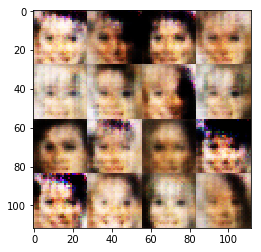

Epoch 0/2... Discriminator Loss: 1.2135... Generator Loss: 1.0143
Epoch 0/2... Discriminator Loss: 1.1015... Generator Loss: 1.2525
Epoch 0/2... Discriminator Loss: 1.1555... Generator Loss: 1.2414
Epoch 0/2... Discriminator Loss: 1.1616... Generator Loss: 0.9714
Epoch 0/2... Discriminator Loss: 1.3789... Generator Loss: 0.8253


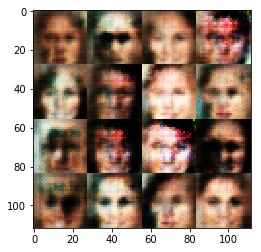

Epoch 0/2... Discriminator Loss: 1.1915... Generator Loss: 1.0212
Epoch 0/2... Discriminator Loss: 1.0833... Generator Loss: 1.0318
Epoch 0/2... Discriminator Loss: 1.1447... Generator Loss: 1.1870
Epoch 0/2... Discriminator Loss: 1.2160... Generator Loss: 0.9793
Epoch 0/2... Discriminator Loss: 1.3445... Generator Loss: 0.9023


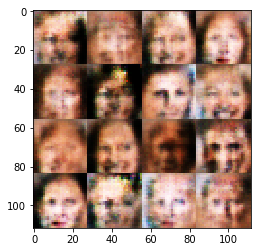

Epoch 0/2... Discriminator Loss: 1.1497... Generator Loss: 1.1784
Epoch 0/2... Discriminator Loss: 1.3784... Generator Loss: 0.9036
Epoch 0/2... Discriminator Loss: 1.3798... Generator Loss: 0.9313
Epoch 0/2... Discriminator Loss: 1.3073... Generator Loss: 0.9139
Epoch 0/2... Discriminator Loss: 1.2189... Generator Loss: 0.9255


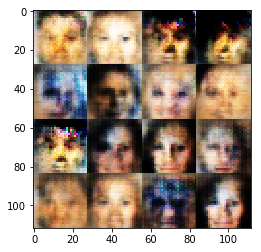

Epoch 0/2... Discriminator Loss: 1.1249... Generator Loss: 1.0091
Epoch 0/2... Discriminator Loss: 1.2455... Generator Loss: 1.4802
Epoch 0/2... Discriminator Loss: 1.1713... Generator Loss: 1.0675
Epoch 0/2... Discriminator Loss: 1.3750... Generator Loss: 1.1750
Epoch 0/2... Discriminator Loss: 1.0995... Generator Loss: 1.0679


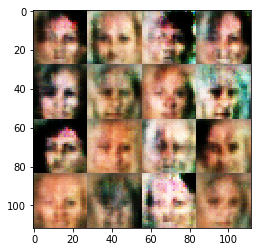

Epoch 0/2... Discriminator Loss: 1.2748... Generator Loss: 0.9194
Epoch 0/2... Discriminator Loss: 1.3798... Generator Loss: 1.0846
Epoch 0/2... Discriminator Loss: 1.2597... Generator Loss: 0.9469
Epoch 0/2... Discriminator Loss: 1.3749... Generator Loss: 0.9479
Epoch 0/2... Discriminator Loss: 1.1744... Generator Loss: 0.8467


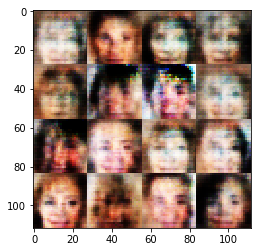

Epoch 0/2... Discriminator Loss: 1.1572... Generator Loss: 1.1887
Epoch 0/2... Discriminator Loss: 1.4538... Generator Loss: 0.5968
Epoch 0/2... Discriminator Loss: 1.3556... Generator Loss: 1.0557
Epoch 0/2... Discriminator Loss: 1.5105... Generator Loss: 0.7128
Epoch 0/2... Discriminator Loss: 1.4691... Generator Loss: 0.9402


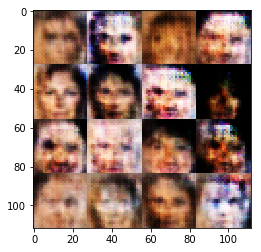

Epoch 0/2... Discriminator Loss: 1.5224... Generator Loss: 0.7428
Epoch 0/2... Discriminator Loss: 1.2530... Generator Loss: 0.9051
Epoch 0/2... Discriminator Loss: 1.2704... Generator Loss: 0.8233
Epoch 0/2... Discriminator Loss: 1.2630... Generator Loss: 0.8686
Epoch 0/2... Discriminator Loss: 1.1301... Generator Loss: 1.0851


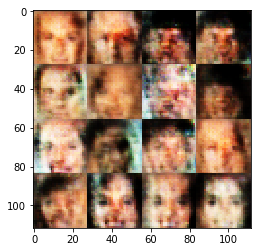

Epoch 0/2... Discriminator Loss: 1.3649... Generator Loss: 1.0412
Epoch 0/2... Discriminator Loss: 1.4724... Generator Loss: 0.8352
Epoch 0/2... Discriminator Loss: 1.7831... Generator Loss: 0.6676
Epoch 0/2... Discriminator Loss: 1.4524... Generator Loss: 0.9528
Epoch 0/2... Discriminator Loss: 1.3464... Generator Loss: 0.8849


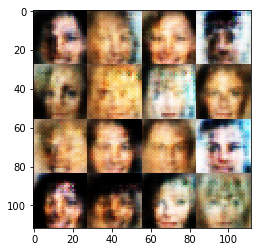

Epoch 0/2... Discriminator Loss: 1.3108... Generator Loss: 1.0378
Epoch 0/2... Discriminator Loss: 1.1800... Generator Loss: 1.1885
Epoch 0/2... Discriminator Loss: 1.0669... Generator Loss: 1.1211
Epoch 0/2... Discriminator Loss: 1.1641... Generator Loss: 1.0157
Epoch 0/2... Discriminator Loss: 1.2577... Generator Loss: 0.7726


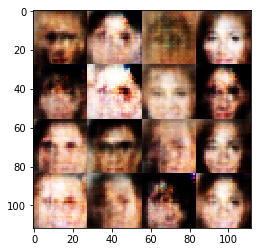

Epoch 0/2... Discriminator Loss: 1.2854... Generator Loss: 0.7103
Epoch 0/2... Discriminator Loss: 1.4953... Generator Loss: 0.9996
Epoch 0/2... Discriminator Loss: 1.4181... Generator Loss: 0.6437
Epoch 0/2... Discriminator Loss: 1.2841... Generator Loss: 0.7047
Epoch 0/2... Discriminator Loss: 0.9864... Generator Loss: 1.3764


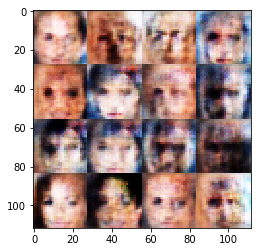

Epoch 0/2... Discriminator Loss: 1.4275... Generator Loss: 1.0379
Epoch 0/2... Discriminator Loss: 1.3184... Generator Loss: 0.9683
Epoch 0/2... Discriminator Loss: 1.4098... Generator Loss: 1.0408
Epoch 0/2... Discriminator Loss: 1.3676... Generator Loss: 0.7520
Epoch 0/2... Discriminator Loss: 1.2784... Generator Loss: 1.1770


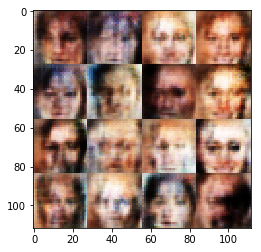

Epoch 0/2... Discriminator Loss: 1.3293... Generator Loss: 0.8255
Epoch 0/2... Discriminator Loss: 1.2073... Generator Loss: 1.0574
Epoch 0/2... Discriminator Loss: 1.2801... Generator Loss: 0.9277
Epoch 0/2... Discriminator Loss: 1.5168... Generator Loss: 0.6131
Epoch 0/2... Discriminator Loss: 1.3522... Generator Loss: 0.8685


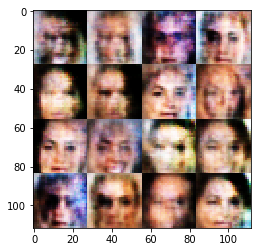

Epoch 0/2... Discriminator Loss: 1.4527... Generator Loss: 0.8185
Epoch 0/2... Discriminator Loss: 1.3666... Generator Loss: 0.8887
Epoch 0/2... Discriminator Loss: 1.1855... Generator Loss: 0.9254
Epoch 0/2... Discriminator Loss: 1.5352... Generator Loss: 0.7138
Epoch 0/2... Discriminator Loss: 1.3703... Generator Loss: 0.9814


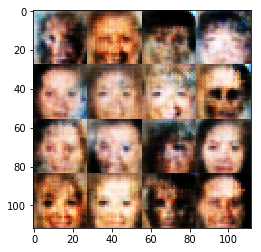

Epoch 0/2... Discriminator Loss: 1.3573... Generator Loss: 0.7388
Epoch 0/2... Discriminator Loss: 1.4424... Generator Loss: 0.9588
Epoch 0/2... Discriminator Loss: 1.1058... Generator Loss: 1.0407
Epoch 0/2... Discriminator Loss: 1.1694... Generator Loss: 1.0677
Epoch 0/2... Discriminator Loss: 0.9115... Generator Loss: 1.3589


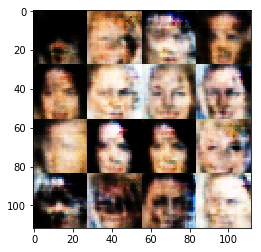

Epoch 0/2... Discriminator Loss: 1.1423... Generator Loss: 1.0879
Epoch 0/2... Discriminator Loss: 1.0544... Generator Loss: 0.9658
Epoch 0/2... Discriminator Loss: 1.4363... Generator Loss: 1.1308
Epoch 0/2... Discriminator Loss: 1.5375... Generator Loss: 0.6387
Epoch 0/2... Discriminator Loss: 1.2107... Generator Loss: 1.0368


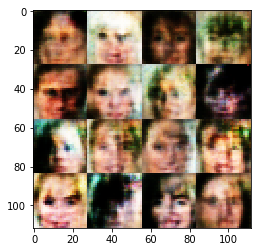

Epoch 0/2... Discriminator Loss: 1.1573... Generator Loss: 1.0233
Epoch 0/2... Discriminator Loss: 1.3311... Generator Loss: 1.0321
Epoch 0/2... Discriminator Loss: 1.4752... Generator Loss: 0.8163
Epoch 0/2... Discriminator Loss: 1.2863... Generator Loss: 0.9667
Epoch 0/2... Discriminator Loss: 1.2697... Generator Loss: 0.7252


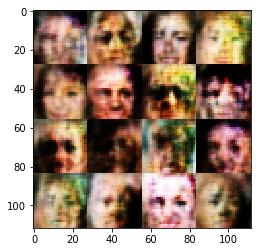

Epoch 0/2... Discriminator Loss: 1.4817... Generator Loss: 0.9631
Epoch 0/2... Discriminator Loss: 1.0429... Generator Loss: 1.1456
Epoch 0/2... Discriminator Loss: 1.4255... Generator Loss: 0.8249
Epoch 0/2... Discriminator Loss: 1.2126... Generator Loss: 1.2295
Epoch 0/2... Discriminator Loss: 1.1817... Generator Loss: 0.9904


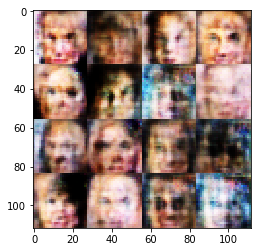

Epoch 0/2... Discriminator Loss: 1.1567... Generator Loss: 1.1262
Epoch 0/2... Discriminator Loss: 1.2857... Generator Loss: 0.9712
Epoch 0/2... Discriminator Loss: 1.4592... Generator Loss: 0.9631
Epoch 0/2... Discriminator Loss: 1.3941... Generator Loss: 0.7247
Epoch 0/2... Discriminator Loss: 1.3326... Generator Loss: 0.9184


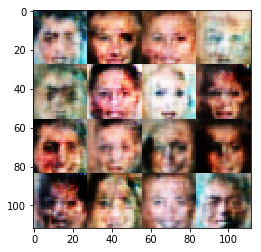

Epoch 0/2... Discriminator Loss: 1.4358... Generator Loss: 0.9503
Epoch 0/2... Discriminator Loss: 1.2018... Generator Loss: 1.0388
Epoch 0/2... Discriminator Loss: 1.2376... Generator Loss: 0.9659
Epoch 0/2... Discriminator Loss: 1.1956... Generator Loss: 1.0333
Epoch 0/2... Discriminator Loss: 1.1992... Generator Loss: 1.3403


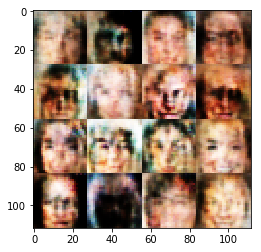

Epoch 0/2... Discriminator Loss: 1.2544... Generator Loss: 1.0325
Epoch 0/2... Discriminator Loss: 1.4943... Generator Loss: 0.8186
Epoch 0/2... Discriminator Loss: 1.5610... Generator Loss: 0.8087
Epoch 0/2... Discriminator Loss: 1.2138... Generator Loss: 0.9978
Epoch 0/2... Discriminator Loss: 1.3383... Generator Loss: 0.9665


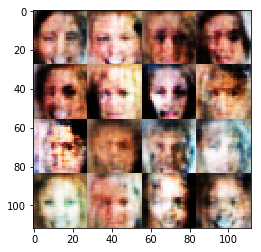

Epoch 0/2... Discriminator Loss: 1.3564... Generator Loss: 0.8996
Epoch 0/2... Discriminator Loss: 1.1573... Generator Loss: 1.1102
Epoch 0/2... Discriminator Loss: 1.1264... Generator Loss: 0.8926
Epoch 0/2... Discriminator Loss: 1.1233... Generator Loss: 1.2347
Epoch 0/2... Discriminator Loss: 1.1153... Generator Loss: 1.1256


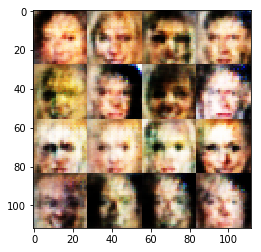

Epoch 0/2... Discriminator Loss: 1.2223... Generator Loss: 0.9500
Epoch 0/2... Discriminator Loss: 1.4270... Generator Loss: 0.7083
Epoch 0/2... Discriminator Loss: 1.3931... Generator Loss: 0.8105
Epoch 0/2... Discriminator Loss: 1.4160... Generator Loss: 0.7258
Epoch 0/2... Discriminator Loss: 1.1184... Generator Loss: 1.0532


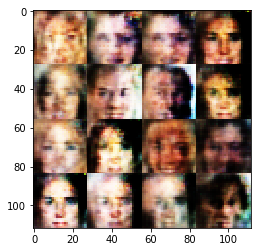

Epoch 0/2... Discriminator Loss: 1.2714... Generator Loss: 1.0359
Epoch 0/2... Discriminator Loss: 1.2492... Generator Loss: 0.8596
Epoch 0/2... Discriminator Loss: 1.2982... Generator Loss: 0.7321
Epoch 0/2... Discriminator Loss: 1.2874... Generator Loss: 0.6789
Epoch 0/2... Discriminator Loss: 1.1857... Generator Loss: 0.7759


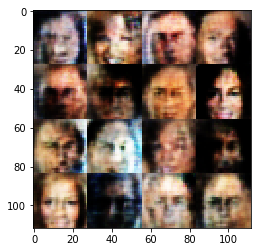

Epoch 0/2... Discriminator Loss: 1.3000... Generator Loss: 0.8099
Epoch 0/2... Discriminator Loss: 1.4882... Generator Loss: 0.4789
Epoch 0/2... Discriminator Loss: 1.3640... Generator Loss: 1.0245
Epoch 0/2... Discriminator Loss: 1.4251... Generator Loss: 0.9804
Epoch 0/2... Discriminator Loss: 1.3802... Generator Loss: 1.0817


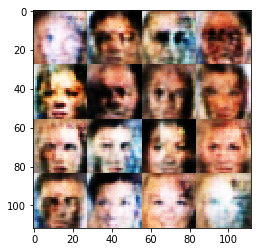

Epoch 0/2... Discriminator Loss: 1.0152... Generator Loss: 1.0358
Epoch 0/2... Discriminator Loss: 1.3392... Generator Loss: 0.8884
Epoch 0/2... Discriminator Loss: 1.1922... Generator Loss: 1.1365
Epoch 0/2... Discriminator Loss: 1.1446... Generator Loss: 1.0688
Epoch 0/2... Discriminator Loss: 1.2153... Generator Loss: 1.0239


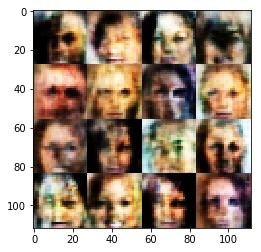

Epoch 0/2... Discriminator Loss: 1.3176... Generator Loss: 0.9323
Epoch 0/2... Discriminator Loss: 1.1972... Generator Loss: 1.2443
Epoch 0/2... Discriminator Loss: 1.5727... Generator Loss: 0.7444
Epoch 0/2... Discriminator Loss: 1.2324... Generator Loss: 0.9265
Epoch 0/2... Discriminator Loss: 1.0993... Generator Loss: 1.0915


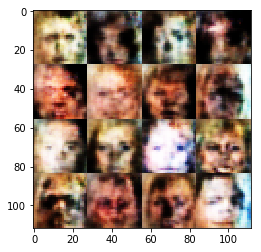

Epoch 0/2... Discriminator Loss: 1.4083... Generator Loss: 0.9578
Epoch 0/2... Discriminator Loss: 1.1738... Generator Loss: 1.2505
Epoch 0/2... Discriminator Loss: 1.1720... Generator Loss: 0.8545
Epoch 0/2... Discriminator Loss: 1.2903... Generator Loss: 0.7281
Epoch 0/2... Discriminator Loss: 1.2417... Generator Loss: 0.9383


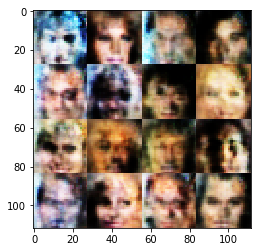

Epoch 0/2... Discriminator Loss: 1.3375... Generator Loss: 0.7282
Epoch 0/2... Discriminator Loss: 1.2948... Generator Loss: 0.8167
Epoch 0/2... Discriminator Loss: 1.1194... Generator Loss: 0.9691
Epoch 0/2... Discriminator Loss: 1.4098... Generator Loss: 1.0067
Epoch 0/2... Discriminator Loss: 1.1809... Generator Loss: 0.9511


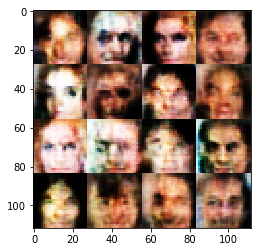

Epoch 0/2... Discriminator Loss: 1.1616... Generator Loss: 0.8774
Epoch 0/2... Discriminator Loss: 1.2772... Generator Loss: 0.7913
Epoch 0/2... Discriminator Loss: 1.1541... Generator Loss: 0.9231
Epoch 0/2... Discriminator Loss: 1.1126... Generator Loss: 1.1486
Epoch 0/2... Discriminator Loss: 1.0994... Generator Loss: 1.1313


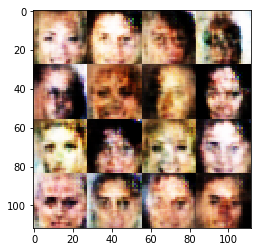

Epoch 0/2... Discriminator Loss: 1.0711... Generator Loss: 1.1161
Epoch 0/2... Discriminator Loss: 1.2140... Generator Loss: 1.0277
Epoch 0/2... Discriminator Loss: 1.0826... Generator Loss: 0.9286
Epoch 0/2... Discriminator Loss: 1.1618... Generator Loss: 1.0844
Epoch 0/2... Discriminator Loss: 1.4196... Generator Loss: 0.8747


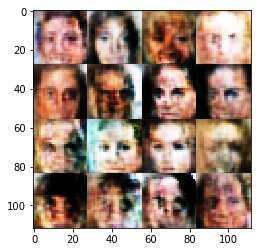

Epoch 0/2... Discriminator Loss: 1.5698... Generator Loss: 0.8323
Epoch 0/2... Discriminator Loss: 1.2718... Generator Loss: 0.8486
Epoch 0/2... Discriminator Loss: 1.2755... Generator Loss: 0.9505
Epoch 0/2... Discriminator Loss: 1.2522... Generator Loss: 0.8001
Epoch 0/2... Discriminator Loss: 1.3349... Generator Loss: 0.7502


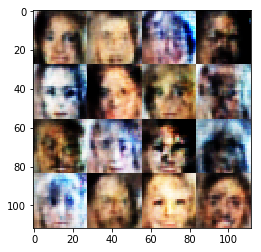

Epoch 0/2... Discriminator Loss: 1.3752... Generator Loss: 1.0776
Epoch 0/2... Discriminator Loss: 1.1070... Generator Loss: 1.2773
Epoch 0/2... Discriminator Loss: 1.1705... Generator Loss: 1.0528
Epoch 0/2... Discriminator Loss: 1.1426... Generator Loss: 0.7674
Epoch 0/2... Discriminator Loss: 1.2804... Generator Loss: 0.9666


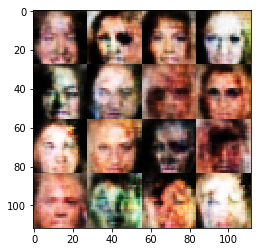

Epoch 0/2... Discriminator Loss: 1.0927... Generator Loss: 1.0837
Epoch 0/2... Discriminator Loss: 1.2007... Generator Loss: 0.9009
Epoch 0/2... Discriminator Loss: 1.2033... Generator Loss: 1.0787
Epoch 0/2... Discriminator Loss: 1.1604... Generator Loss: 0.8749
Epoch 0/2... Discriminator Loss: 1.1121... Generator Loss: 1.0761


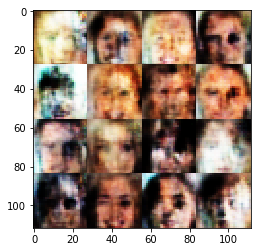

Epoch 0/2... Discriminator Loss: 1.3024... Generator Loss: 1.0564
Epoch 0/2... Discriminator Loss: 1.1069... Generator Loss: 1.2634
Epoch 0/2... Discriminator Loss: 1.1355... Generator Loss: 0.8521
Epoch 0/2... Discriminator Loss: 1.3332... Generator Loss: 0.7909
Epoch 0/2... Discriminator Loss: 1.3472... Generator Loss: 0.9581


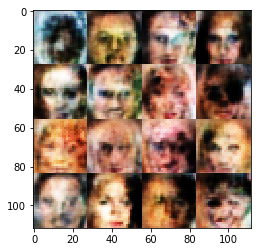

Epoch 0/2... Discriminator Loss: 1.3008... Generator Loss: 0.8558
Epoch 0/2... Discriminator Loss: 1.1038... Generator Loss: 0.9773
Epoch 0/2... Discriminator Loss: 1.0666... Generator Loss: 1.2566
Epoch 0/2... Discriminator Loss: 1.2099... Generator Loss: 1.0330
Epoch 0/2... Discriminator Loss: 1.0554... Generator Loss: 1.1639


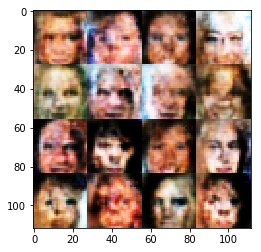

Epoch 0/2... Discriminator Loss: 1.0875... Generator Loss: 0.9627
Epoch 0/2... Discriminator Loss: 1.3292... Generator Loss: 0.7162
Epoch 0/2... Discriminator Loss: 1.2803... Generator Loss: 0.8107
Epoch 0/2... Discriminator Loss: 1.1878... Generator Loss: 1.0899
Epoch 0/2... Discriminator Loss: 1.3327... Generator Loss: 0.7122


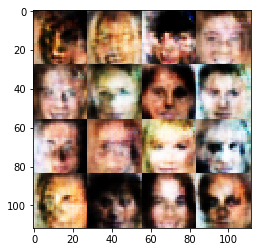

Epoch 0/2... Discriminator Loss: 1.3045... Generator Loss: 0.9194
Epoch 0/2... Discriminator Loss: 1.3066... Generator Loss: 0.8806
Epoch 0/2... Discriminator Loss: 1.1580... Generator Loss: 1.1118
Epoch 0/2... Discriminator Loss: 1.1129... Generator Loss: 1.0998
Epoch 0/2... Discriminator Loss: 1.2614... Generator Loss: 0.8268


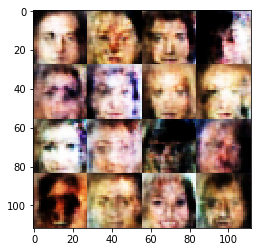

Epoch 0/2... Discriminator Loss: 1.2809... Generator Loss: 1.0283
Epoch 0/2... Discriminator Loss: 1.2029... Generator Loss: 1.1070
Epoch 0/2... Discriminator Loss: 1.2536... Generator Loss: 1.1015
Epoch 0/2... Discriminator Loss: 1.0067... Generator Loss: 1.1031
Epoch 0/2... Discriminator Loss: 1.1060... Generator Loss: 1.1706


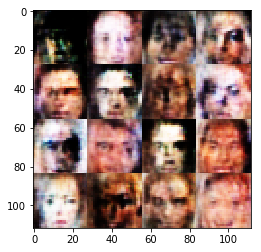

Epoch 0/2... Discriminator Loss: 1.2950... Generator Loss: 0.8646
Epoch 0/2... Discriminator Loss: 1.2964... Generator Loss: 0.9519
Epoch 0/2... Discriminator Loss: 1.3404... Generator Loss: 0.7481
Epoch 0/2... Discriminator Loss: 1.0315... Generator Loss: 1.1914
Epoch 0/2... Discriminator Loss: 1.1927... Generator Loss: 0.9499


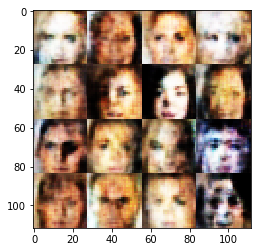

Epoch 0/2... Discriminator Loss: 1.0118... Generator Loss: 1.1144
Epoch 0/2... Discriminator Loss: 1.0371... Generator Loss: 1.4076
Epoch 0/2... Discriminator Loss: 1.0477... Generator Loss: 1.2264
Epoch 0/2... Discriminator Loss: 1.1254... Generator Loss: 1.3704
Epoch 0/2... Discriminator Loss: 1.0170... Generator Loss: 0.8874


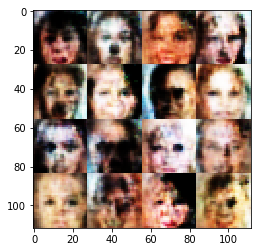

Epoch 0/2... Discriminator Loss: 1.1439... Generator Loss: 1.1430
Epoch 0/2... Discriminator Loss: 1.0501... Generator Loss: 0.9204
Epoch 0/2... Discriminator Loss: 1.0496... Generator Loss: 1.2807
Epoch 0/2... Discriminator Loss: 1.4282... Generator Loss: 0.6999
Epoch 0/2... Discriminator Loss: 1.2917... Generator Loss: 0.8409


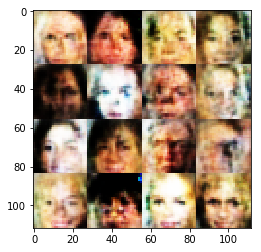

Epoch 0/2... Discriminator Loss: 1.2661... Generator Loss: 0.9151
Epoch 0/2... Discriminator Loss: 0.9685... Generator Loss: 1.2146
Epoch 0/2... Discriminator Loss: 0.9867... Generator Loss: 1.3889
Epoch 0/2... Discriminator Loss: 1.0749... Generator Loss: 0.9251
Epoch 0/2... Discriminator Loss: 1.0076... Generator Loss: 1.0833


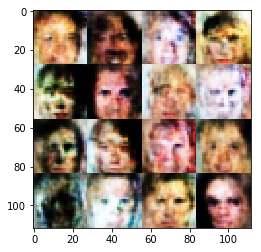

Epoch 0/2... Discriminator Loss: 1.2474... Generator Loss: 0.9583
Epoch 0/2... Discriminator Loss: 1.1398... Generator Loss: 0.9280
Epoch 0/2... Discriminator Loss: 1.3805... Generator Loss: 0.6766
Epoch 0/2... Discriminator Loss: 1.1558... Generator Loss: 1.2891
Epoch 0/2... Discriminator Loss: 1.1737... Generator Loss: 0.7874


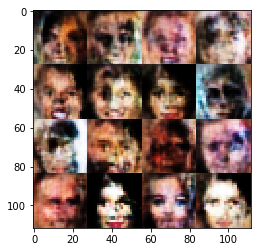

Epoch 0/2... Discriminator Loss: 1.2041... Generator Loss: 0.7282
Epoch 0/2... Discriminator Loss: 1.0927... Generator Loss: 1.1446
Epoch 0/2... Discriminator Loss: 1.2433... Generator Loss: 0.8708
Epoch 0/2... Discriminator Loss: 0.9700... Generator Loss: 1.3671
Epoch 0/2... Discriminator Loss: 1.1151... Generator Loss: 1.2393


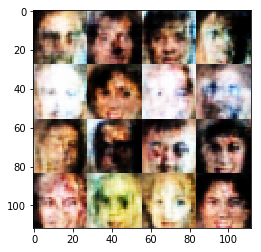

Epoch 0/2... Discriminator Loss: 1.0280... Generator Loss: 1.0559
Epoch 0/2... Discriminator Loss: 1.0326... Generator Loss: 1.2987
Epoch 0/2... Discriminator Loss: 1.2107... Generator Loss: 1.0365
Epoch 0/2... Discriminator Loss: 1.0763... Generator Loss: 1.1675
Epoch 0/2... Discriminator Loss: 1.4619... Generator Loss: 0.9291


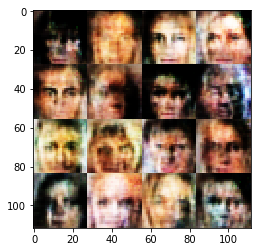

Epoch 0/2... Discriminator Loss: 1.0432... Generator Loss: 1.1988
Epoch 0/2... Discriminator Loss: 1.1246... Generator Loss: 1.1648
Epoch 0/2... Discriminator Loss: 1.1675... Generator Loss: 1.0100
Epoch 0/2... Discriminator Loss: 1.1675... Generator Loss: 1.0189
Epoch 0/2... Discriminator Loss: 1.1316... Generator Loss: 0.9139


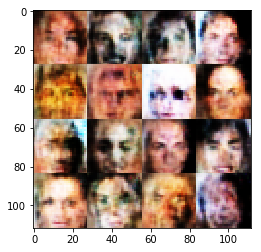

Epoch 0/2... Discriminator Loss: 0.9530... Generator Loss: 1.3777
Epoch 0/2... Discriminator Loss: 1.1845... Generator Loss: 0.9547
Epoch 0/2... Discriminator Loss: 0.9882... Generator Loss: 1.1786
Epoch 0/2... Discriminator Loss: 0.9799... Generator Loss: 1.1771
Epoch 0/2... Discriminator Loss: 1.1745... Generator Loss: 1.0483


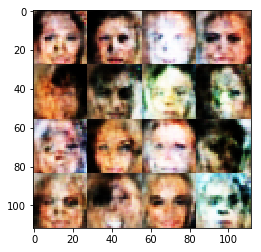

Epoch 0/2... Discriminator Loss: 1.0834... Generator Loss: 1.1764
Epoch 0/2... Discriminator Loss: 0.9772... Generator Loss: 1.0062
Epoch 0/2... Discriminator Loss: 0.9516... Generator Loss: 1.6051
Epoch 0/2... Discriminator Loss: 1.1242... Generator Loss: 1.0431
Epoch 0/2... Discriminator Loss: 1.1403... Generator Loss: 1.1792


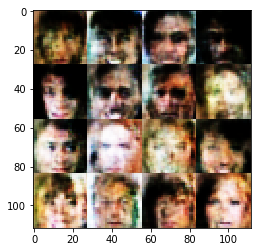

Epoch 0/2... Discriminator Loss: 0.9718... Generator Loss: 1.2445
Epoch 0/2... Discriminator Loss: 0.9848... Generator Loss: 1.1860
Epoch 0/2... Discriminator Loss: 1.1098... Generator Loss: 1.2502
Epoch 0/2... Discriminator Loss: 0.9825... Generator Loss: 1.1023
Epoch 0/2... Discriminator Loss: 1.2908... Generator Loss: 0.7247


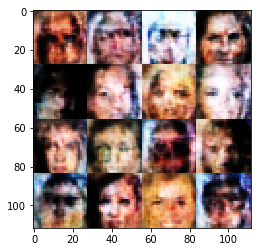

Epoch 0/2... Discriminator Loss: 1.0124... Generator Loss: 1.1108
Epoch 0/2... Discriminator Loss: 1.0295... Generator Loss: 1.1130
Epoch 0/2... Discriminator Loss: 1.0714... Generator Loss: 1.1087
Epoch 0/2... Discriminator Loss: 0.9307... Generator Loss: 1.5247
Epoch 0/2... Discriminator Loss: 1.1140... Generator Loss: 0.7789


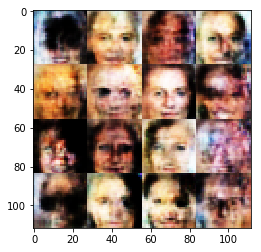

Epoch 0/2... Discriminator Loss: 1.3188... Generator Loss: 1.0175
Epoch 0/2... Discriminator Loss: 0.7680... Generator Loss: 1.6189
Epoch 0/2... Discriminator Loss: 0.9451... Generator Loss: 1.3743
Epoch 0/2... Discriminator Loss: 1.1355... Generator Loss: 1.1090
Epoch 0/2... Discriminator Loss: 1.0701... Generator Loss: 0.9499


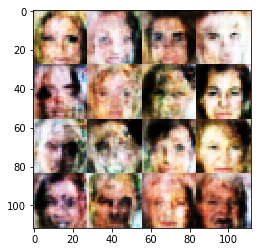

Epoch 0/2... Discriminator Loss: 1.3749... Generator Loss: 0.7846
Epoch 0/2... Discriminator Loss: 0.9341... Generator Loss: 1.4224
Epoch 0/2... Discriminator Loss: 1.0168... Generator Loss: 1.2962
Epoch 0/2... Discriminator Loss: 0.9850... Generator Loss: 1.5693
Epoch 0/2... Discriminator Loss: 1.0881... Generator Loss: 1.0869


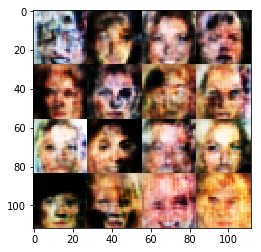

Epoch 0/2... Discriminator Loss: 1.1462... Generator Loss: 0.8653
Epoch 0/2... Discriminator Loss: 0.8889... Generator Loss: 1.1004
Epoch 0/2... Discriminator Loss: 0.9862... Generator Loss: 1.3512
Epoch 0/2... Discriminator Loss: 0.8873... Generator Loss: 1.3085
Epoch 0/2... Discriminator Loss: 1.1419... Generator Loss: 0.8279


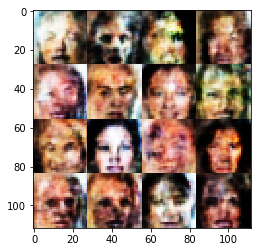

Epoch 0/2... Discriminator Loss: 1.1326... Generator Loss: 0.8754
Epoch 0/2... Discriminator Loss: 0.9598... Generator Loss: 1.0676
Epoch 0/2... Discriminator Loss: 1.1099... Generator Loss: 0.9270
Epoch 0/2... Discriminator Loss: 1.1890... Generator Loss: 1.0046
Epoch 0/2... Discriminator Loss: 1.0389... Generator Loss: 1.2268


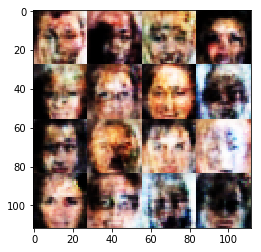

Epoch 0/2... Discriminator Loss: 0.8844... Generator Loss: 1.4785
Epoch 0/2... Discriminator Loss: 0.9308... Generator Loss: 1.2640
Epoch 0/2... Discriminator Loss: 0.8104... Generator Loss: 1.2046
Epoch 0/2... Discriminator Loss: 1.1345... Generator Loss: 1.0734
Epoch 0/2... Discriminator Loss: 1.0948... Generator Loss: 1.7881


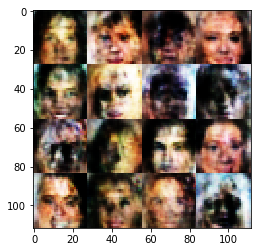

Epoch 0/2... Discriminator Loss: 1.1137... Generator Loss: 1.1719
Epoch 0/2... Discriminator Loss: 1.0725... Generator Loss: 1.1090
Epoch 0/2... Discriminator Loss: 0.9531... Generator Loss: 1.3176
Epoch 0/2... Discriminator Loss: 1.3021... Generator Loss: 0.8763
Epoch 0/2... Discriminator Loss: 1.0593... Generator Loss: 1.4257


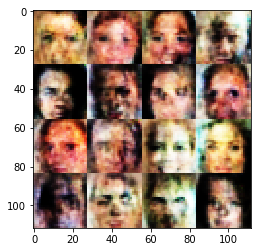

Epoch 0/2... Discriminator Loss: 1.1592... Generator Loss: 0.8952
Epoch 0/2... Discriminator Loss: 0.9369... Generator Loss: 1.0804
Epoch 0/2... Discriminator Loss: 1.1935... Generator Loss: 0.8146
Epoch 0/2... Discriminator Loss: 0.9450... Generator Loss: 1.2392
Epoch 0/2... Discriminator Loss: 1.1025... Generator Loss: 1.0700


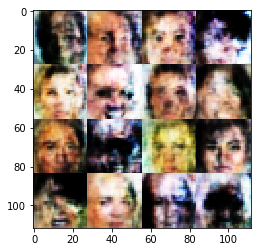

Epoch 0/2... Discriminator Loss: 0.9060... Generator Loss: 1.3935
Epoch 0/2... Discriminator Loss: 0.9939... Generator Loss: 1.2994
Epoch 0/2... Discriminator Loss: 1.0920... Generator Loss: 1.0708
Epoch 0/2... Discriminator Loss: 1.0711... Generator Loss: 1.1493
Epoch 0/2... Discriminator Loss: 1.1532... Generator Loss: 1.5295


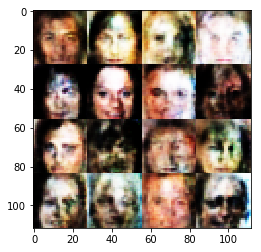

Epoch 0/2... Discriminator Loss: 1.2868... Generator Loss: 1.1093
Epoch 0/2... Discriminator Loss: 0.9510... Generator Loss: 1.3593
Epoch 0/2... Discriminator Loss: 1.0254... Generator Loss: 1.1041
Epoch 0/2... Discriminator Loss: 1.0765... Generator Loss: 0.7642
Epoch 0/2... Discriminator Loss: 0.9612... Generator Loss: 1.1743


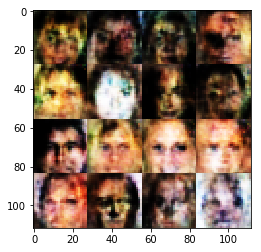

Epoch 0/2... Discriminator Loss: 1.0048... Generator Loss: 1.1039
Epoch 0/2... Discriminator Loss: 0.9292... Generator Loss: 1.1402
Epoch 0/2... Discriminator Loss: 1.0388... Generator Loss: 0.9675
Epoch 0/2... Discriminator Loss: 1.2418... Generator Loss: 0.7816
Epoch 0/2... Discriminator Loss: 0.9564... Generator Loss: 1.1966


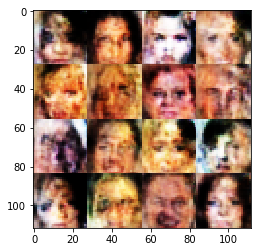

Epoch 0/2... Discriminator Loss: 0.8888... Generator Loss: 1.8424
Epoch 0/2... Discriminator Loss: 0.9913... Generator Loss: 1.2115
Epoch 0/2... Discriminator Loss: 1.1754... Generator Loss: 1.0587
Epoch 0/2... Discriminator Loss: 0.8778... Generator Loss: 1.4419
Epoch 0/2... Discriminator Loss: 1.0490... Generator Loss: 1.2710


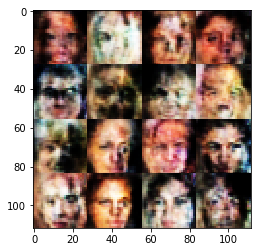

Epoch 0/2... Discriminator Loss: 0.9874... Generator Loss: 1.1919
Epoch 0/2... Discriminator Loss: 1.1008... Generator Loss: 1.0899
Epoch 0/2... Discriminator Loss: 0.9387... Generator Loss: 1.3030
Epoch 0/2... Discriminator Loss: 0.8951... Generator Loss: 1.1161
Epoch 0/2... Discriminator Loss: 1.0409... Generator Loss: 0.8962


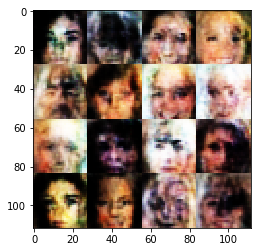

Epoch 0/2... Discriminator Loss: 0.8135... Generator Loss: 1.6160
Epoch 0/2... Discriminator Loss: 1.1316... Generator Loss: 0.9148
Epoch 0/2... Discriminator Loss: 1.0511... Generator Loss: 1.5867
Epoch 0/2... Discriminator Loss: 1.0243... Generator Loss: 1.7685
Epoch 0/2... Discriminator Loss: 0.9684... Generator Loss: 1.0068


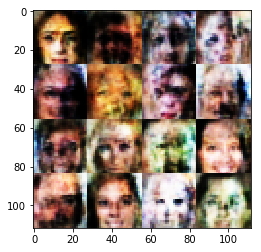

Epoch 0/2... Discriminator Loss: 1.1500... Generator Loss: 1.7321
Epoch 0/2... Discriminator Loss: 1.1102... Generator Loss: 1.5577
Epoch 0/2... Discriminator Loss: 0.9049... Generator Loss: 1.3046
Epoch 0/2... Discriminator Loss: 0.8824... Generator Loss: 1.3254
Epoch 0/2... Discriminator Loss: 1.0737... Generator Loss: 1.1350


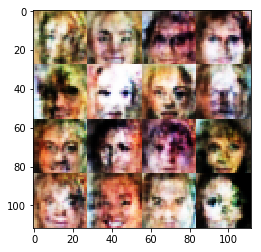

Epoch 0/2... Discriminator Loss: 0.8314... Generator Loss: 1.5352
Epoch 0/2... Discriminator Loss: 0.8302... Generator Loss: 1.3106
Epoch 0/2... Discriminator Loss: 0.8795... Generator Loss: 1.2522
Epoch 0/2... Discriminator Loss: 0.9470... Generator Loss: 1.2195
Epoch 0/2... Discriminator Loss: 0.9363... Generator Loss: 1.4519


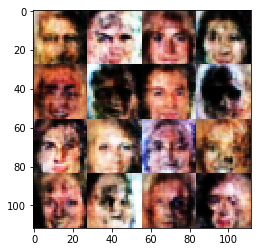

Epoch 0/2... Discriminator Loss: 1.0260... Generator Loss: 0.9809
Epoch 0/2... Discriminator Loss: 0.9708... Generator Loss: 1.5314
Epoch 0/2... Discriminator Loss: 0.9238... Generator Loss: 1.2442
Epoch 0/2... Discriminator Loss: 0.9012... Generator Loss: 1.6282
Epoch 0/2... Discriminator Loss: 1.2654... Generator Loss: 0.5761


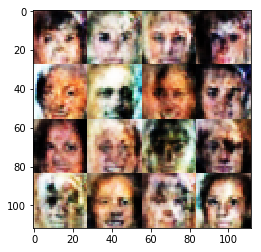

Epoch 0/2... Discriminator Loss: 0.8402... Generator Loss: 1.5219
Epoch 0/2... Discriminator Loss: 0.8381... Generator Loss: 1.2809
Epoch 0/2... Discriminator Loss: 0.8654... Generator Loss: 1.2009
Epoch 0/2... Discriminator Loss: 0.8660... Generator Loss: 1.5637
Epoch 0/2... Discriminator Loss: 1.0413... Generator Loss: 0.9479


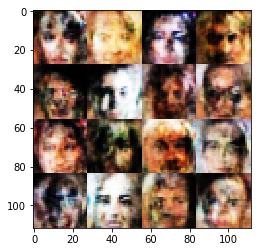

Epoch 0/2... Discriminator Loss: 1.2606... Generator Loss: 1.1609
Epoch 0/2... Discriminator Loss: 0.7939... Generator Loss: 1.7337
Epoch 0/2... Discriminator Loss: 0.9817... Generator Loss: 1.9785
Epoch 0/2... Discriminator Loss: 0.9279... Generator Loss: 1.3084
Epoch 0/2... Discriminator Loss: 0.9760... Generator Loss: 1.1321


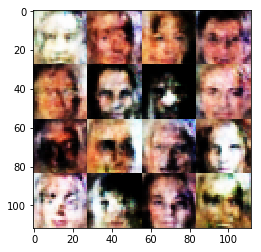

Epoch 0/2... Discriminator Loss: 0.7762... Generator Loss: 1.2540
Epoch 0/2... Discriminator Loss: 0.8387... Generator Loss: 1.5081
Epoch 0/2... Discriminator Loss: 1.1830... Generator Loss: 0.9536
Epoch 0/2... Discriminator Loss: 0.8418... Generator Loss: 1.4908
Epoch 0/2... Discriminator Loss: 0.9688... Generator Loss: 1.5406


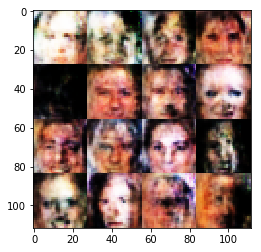

Epoch 0/2... Discriminator Loss: 0.8341... Generator Loss: 1.1956
Epoch 0/2... Discriminator Loss: 0.9101... Generator Loss: 1.2438
Epoch 0/2... Discriminator Loss: 0.9165... Generator Loss: 1.5182
Epoch 0/2... Discriminator Loss: 0.9780... Generator Loss: 1.1512
Epoch 0/2... Discriminator Loss: 1.0701... Generator Loss: 1.1051


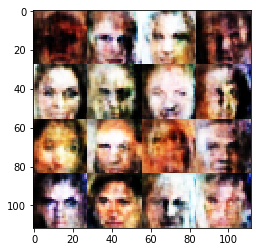

Epoch 0/2... Discriminator Loss: 0.9736... Generator Loss: 1.7664
Epoch 0/2... Discriminator Loss: 0.7396... Generator Loss: 1.1109
Epoch 0/2... Discriminator Loss: 0.8782... Generator Loss: 1.5928
Epoch 0/2... Discriminator Loss: 0.8094... Generator Loss: 1.5138
Epoch 0/2... Discriminator Loss: 0.8863... Generator Loss: 1.8171


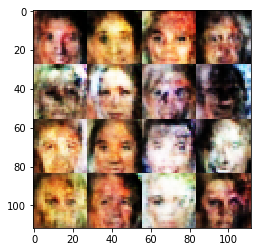

Epoch 0/2... Discriminator Loss: 0.8536... Generator Loss: 1.6550
Epoch 0/2... Discriminator Loss: 1.0884... Generator Loss: 1.0722
Epoch 0/2... Discriminator Loss: 0.9001... Generator Loss: 1.9122
Epoch 0/2... Discriminator Loss: 0.7496... Generator Loss: 1.6855
Epoch 0/2... Discriminator Loss: 0.9015... Generator Loss: 1.6042


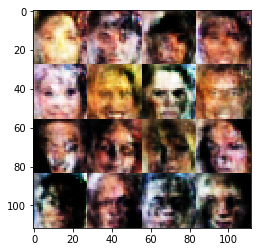

Epoch 0/2... Discriminator Loss: 0.9051... Generator Loss: 1.1728
Epoch 0/2... Discriminator Loss: 1.0846... Generator Loss: 0.9666
Epoch 0/2... Discriminator Loss: 0.9700... Generator Loss: 1.3483
Epoch 0/2... Discriminator Loss: 1.0028... Generator Loss: 1.3597
Epoch 0/2... Discriminator Loss: 1.6879... Generator Loss: 0.8484


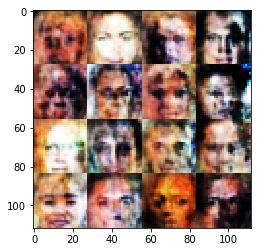

Epoch 0/2... Discriminator Loss: 0.8925... Generator Loss: 1.6095
Epoch 0/2... Discriminator Loss: 0.8868... Generator Loss: 1.1543
Epoch 0/2... Discriminator Loss: 0.9091... Generator Loss: 1.9920
Epoch 0/2... Discriminator Loss: 0.7867... Generator Loss: 1.3707
Epoch 0/2... Discriminator Loss: 0.7641... Generator Loss: 2.0096


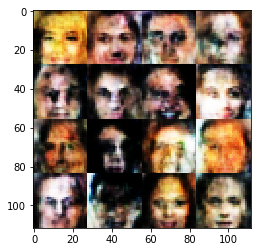

Epoch 0/2... Discriminator Loss: 1.0451... Generator Loss: 1.0797
Epoch 0/2... Discriminator Loss: 0.9360... Generator Loss: 1.3060
Epoch 0/2... Discriminator Loss: 0.7699... Generator Loss: 1.6263
Epoch 0/2... Discriminator Loss: 0.7927... Generator Loss: 1.5722
Epoch 0/2... Discriminator Loss: 0.9066... Generator Loss: 1.8989


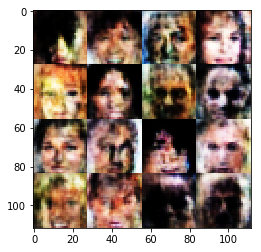

Epoch 0/2... Discriminator Loss: 0.7598... Generator Loss: 1.5504
Epoch 0/2... Discriminator Loss: 0.8518... Generator Loss: 1.1741
Epoch 0/2... Discriminator Loss: 0.8479... Generator Loss: 1.4148
Epoch 0/2... Discriminator Loss: 1.1033... Generator Loss: 1.1662
Epoch 0/2... Discriminator Loss: 0.6595... Generator Loss: 2.2077


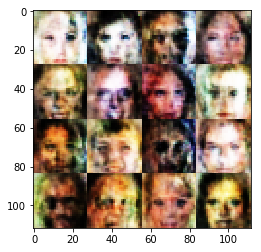

Epoch 0/2... Discriminator Loss: 0.8950... Generator Loss: 1.5150
Epoch 0/2... Discriminator Loss: 0.6958... Generator Loss: 2.4883
Epoch 0/2... Discriminator Loss: 0.9528... Generator Loss: 1.1260
Epoch 0/2... Discriminator Loss: 0.9427... Generator Loss: 1.5705
Epoch 0/2... Discriminator Loss: 0.9979... Generator Loss: 1.1527


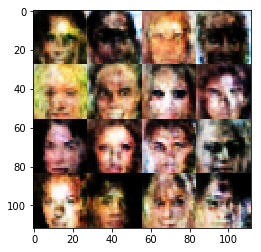

Epoch 0/2... Discriminator Loss: 0.8493... Generator Loss: 1.5121
Epoch 0/2... Discriminator Loss: 0.7535... Generator Loss: 1.7755
Epoch 0/2... Discriminator Loss: 0.7792... Generator Loss: 1.6537
Epoch 0/2... Discriminator Loss: 0.6311... Generator Loss: 2.5921
Epoch 0/2... Discriminator Loss: 0.8583... Generator Loss: 1.9909


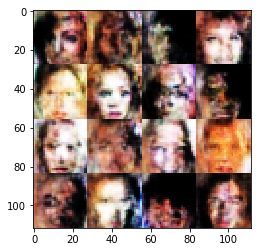

Epoch 0/2... Discriminator Loss: 0.8337... Generator Loss: 1.7140
Epoch 0/2... Discriminator Loss: 0.7510... Generator Loss: 1.2519
Epoch 0/2... Discriminator Loss: 0.6983... Generator Loss: 1.8097
Epoch 0/2... Discriminator Loss: 0.7433... Generator Loss: 1.5201
Epoch 0/2... Discriminator Loss: 0.7159... Generator Loss: 1.7904


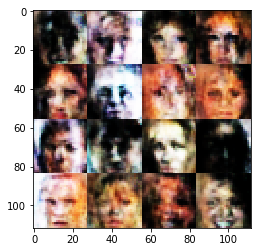

Epoch 0/2... Discriminator Loss: 1.1131... Generator Loss: 1.8253
Epoch 0/2... Discriminator Loss: 0.9185... Generator Loss: 1.5173
Epoch 0/2... Discriminator Loss: 1.0963... Generator Loss: 1.0675
Epoch 0/2... Discriminator Loss: 0.8450... Generator Loss: 1.7026
Epoch 0/2... Discriminator Loss: 0.7068... Generator Loss: 2.0697


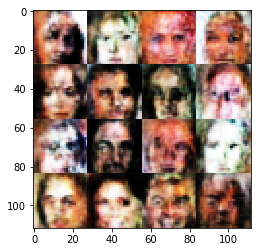

Epoch 0/2... Discriminator Loss: 1.1692... Generator Loss: 1.2508
Epoch 0/2... Discriminator Loss: 0.7430... Generator Loss: 1.7046
Epoch 0/2... Discriminator Loss: 0.9378... Generator Loss: 1.0233
Epoch 0/2... Discriminator Loss: 0.7956... Generator Loss: 1.0106
Epoch 0/2... Discriminator Loss: 0.8769... Generator Loss: 1.2982


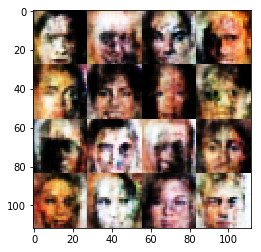

Epoch 0/2... Discriminator Loss: 0.6876... Generator Loss: 1.6708
Epoch 0/2... Discriminator Loss: 0.7987... Generator Loss: 1.2651
Epoch 0/2... Discriminator Loss: 0.8393... Generator Loss: 1.5064
Epoch 0/2... Discriminator Loss: 1.0443... Generator Loss: 1.3825
Epoch 0/2... Discriminator Loss: 0.8001... Generator Loss: 1.9874


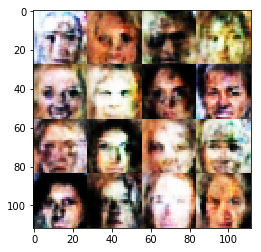

Epoch 0/2... Discriminator Loss: 0.8226... Generator Loss: 1.5897
Epoch 0/2... Discriminator Loss: 0.6447... Generator Loss: 1.9279
Epoch 0/2... Discriminator Loss: 0.6488... Generator Loss: 2.0922
Epoch 0/2... Discriminator Loss: 0.7151... Generator Loss: 1.8714
Epoch 0/2... Discriminator Loss: 0.8539... Generator Loss: 1.5613


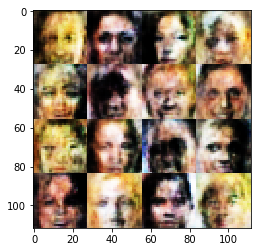

Epoch 0/2... Discriminator Loss: 0.8054... Generator Loss: 1.8776
Epoch 0/2... Discriminator Loss: 0.8757... Generator Loss: 1.2672
Epoch 0/2... Discriminator Loss: 0.7455... Generator Loss: 1.1846
Epoch 0/2... Discriminator Loss: 0.8612... Generator Loss: 1.5530
Epoch 0/2... Discriminator Loss: 0.7999... Generator Loss: 1.5091


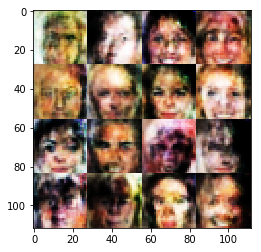

Epoch 0/2... Discriminator Loss: 0.7175... Generator Loss: 1.8844
Epoch 0/2... Discriminator Loss: 0.6955... Generator Loss: 1.8974
Epoch 0/2... Discriminator Loss: 0.9120... Generator Loss: 1.2213
Epoch 0/2... Discriminator Loss: 0.8472... Generator Loss: 1.8785
Epoch 0/2... Discriminator Loss: 0.9039... Generator Loss: 1.4332


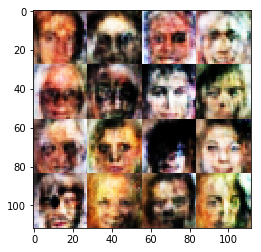

Epoch 0/2... Discriminator Loss: 0.9089... Generator Loss: 1.1827
Epoch 0/2... Discriminator Loss: 0.8614... Generator Loss: 2.2737
Epoch 0/2... Discriminator Loss: 1.0024... Generator Loss: 1.2402
Epoch 0/2... Discriminator Loss: 0.7998... Generator Loss: 1.4244
Epoch 0/2... Discriminator Loss: 0.7493... Generator Loss: 2.3890


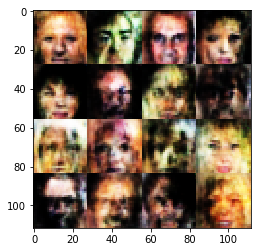

Epoch 0/2... Discriminator Loss: 0.6953... Generator Loss: 2.0627
Epoch 0/2... Discriminator Loss: 0.6792... Generator Loss: 2.2598
Epoch 0/2... Discriminator Loss: 1.3323... Generator Loss: 0.8788
Epoch 0/2... Discriminator Loss: 0.8422... Generator Loss: 1.1244
Epoch 0/2... Discriminator Loss: 0.9744... Generator Loss: 1.2171


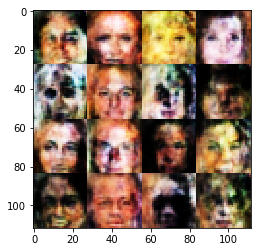

Epoch 0/2... Discriminator Loss: 0.8937... Generator Loss: 1.0466
Epoch 0/2... Discriminator Loss: 0.9790... Generator Loss: 1.2841
Epoch 0/2... Discriminator Loss: 0.7568... Generator Loss: 1.8469
Epoch 0/2... Discriminator Loss: 1.0705... Generator Loss: 1.3382
Epoch 0/2... Discriminator Loss: 1.2821... Generator Loss: 1.1759


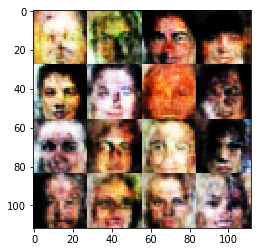

Epoch 0/2... Discriminator Loss: 0.6832... Generator Loss: 2.0457
Epoch 0/2... Discriminator Loss: 0.7981... Generator Loss: 1.4468
Epoch 0/2... Discriminator Loss: 1.1881... Generator Loss: 1.6145
Epoch 0/2... Discriminator Loss: 0.8310... Generator Loss: 1.6788
Epoch 0/2... Discriminator Loss: 0.7867... Generator Loss: 1.6648


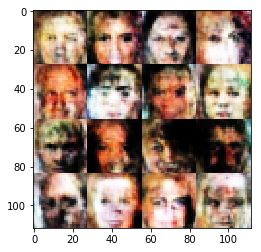

Epoch 0/2... Discriminator Loss: 0.5953... Generator Loss: 1.9696
Epoch 0/2... Discriminator Loss: 0.6613... Generator Loss: 1.8138
Epoch 0/2... Discriminator Loss: 0.8943... Generator Loss: 1.2602
Epoch 0/2... Discriminator Loss: 0.9803... Generator Loss: 1.8483
Epoch 0/2... Discriminator Loss: 0.9024... Generator Loss: 1.9033


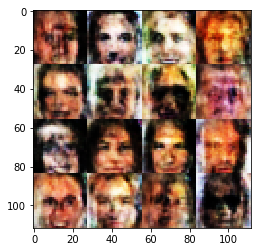

Epoch 0/2... Discriminator Loss: 0.7456... Generator Loss: 1.4420
Epoch 0/2... Discriminator Loss: 0.9011... Generator Loss: 1.6298
Epoch 0/2... Discriminator Loss: 0.7193... Generator Loss: 1.4055
Epoch 0/2... Discriminator Loss: 0.7919... Generator Loss: 1.2529
Epoch 0/2... Discriminator Loss: 0.8510... Generator Loss: 2.2057


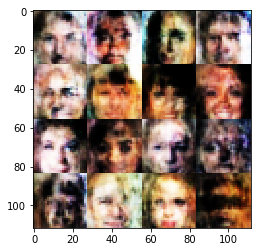

Epoch 0/2... Discriminator Loss: 0.9695... Generator Loss: 1.5370
Epoch 0/2... Discriminator Loss: 1.0407... Generator Loss: 1.2135
Epoch 0/2... Discriminator Loss: 0.7405... Generator Loss: 1.4017
Epoch 0/2... Discriminator Loss: 0.7512... Generator Loss: 1.3723
Epoch 0/2... Discriminator Loss: 0.7851... Generator Loss: 1.4830


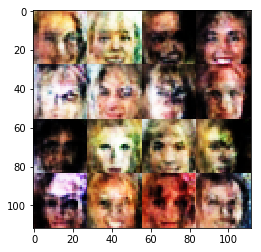

Epoch 0/2... Discriminator Loss: 0.7826... Generator Loss: 1.5243
Epoch 0/2... Discriminator Loss: 1.1879... Generator Loss: 1.4112
Epoch 0/2... Discriminator Loss: 0.8181... Generator Loss: 1.5327
Epoch 0/2... Discriminator Loss: 0.9781... Generator Loss: 0.8766
Epoch 0/2... Discriminator Loss: 0.8261... Generator Loss: 2.2994


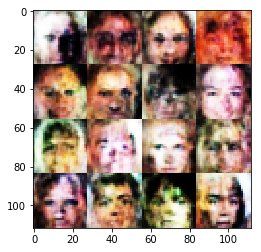

Epoch 0/2... Discriminator Loss: 0.7280... Generator Loss: 2.1060
Epoch 0/2... Discriminator Loss: 0.6930... Generator Loss: 1.5078
Epoch 0/2... Discriminator Loss: 0.9657... Generator Loss: 1.7724
Epoch 0/2... Discriminator Loss: 0.8270... Generator Loss: 1.3931
Epoch 0/2... Discriminator Loss: 0.7945... Generator Loss: 1.8538


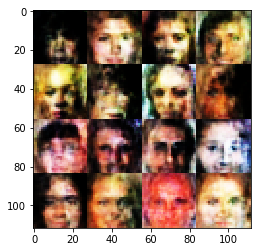

Epoch 0/2... Discriminator Loss: 0.8038... Generator Loss: 1.8622
Epoch 0/2... Discriminator Loss: 0.8097... Generator Loss: 1.5198
Epoch 0/2... Discriminator Loss: 0.8528... Generator Loss: 1.6697
Epoch 0/2... Discriminator Loss: 0.7683... Generator Loss: 1.8191
Epoch 0/2... Discriminator Loss: 0.7829... Generator Loss: 1.7884


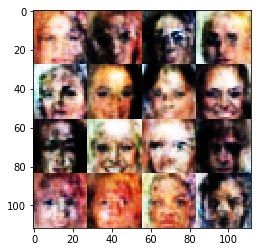

Epoch 0/2... Discriminator Loss: 1.1573... Generator Loss: 1.4376
Epoch 0/2... Discriminator Loss: 0.7536... Generator Loss: 1.9322
Epoch 0/2... Discriminator Loss: 0.8988... Generator Loss: 1.2437
Epoch 0/2... Discriminator Loss: 0.9322... Generator Loss: 1.7659
Epoch 0/2... Discriminator Loss: 0.7594... Generator Loss: 2.1858


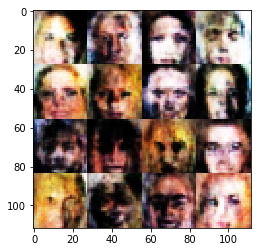

Epoch 0/2... Discriminator Loss: 1.0913... Generator Loss: 2.1153
Epoch 0/2... Discriminator Loss: 0.7046... Generator Loss: 1.5011
Epoch 0/2... Discriminator Loss: 0.8205... Generator Loss: 1.1576
Epoch 0/2... Discriminator Loss: 0.8292... Generator Loss: 1.7305
Epoch 0/2... Discriminator Loss: 0.6716... Generator Loss: 1.6569


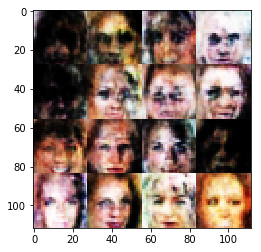

Epoch 0/2... Discriminator Loss: 0.8294... Generator Loss: 1.7535
Epoch 0/2... Discriminator Loss: 1.0121... Generator Loss: 1.8236
Epoch 0/2... Discriminator Loss: 1.1440... Generator Loss: 0.9772
Epoch 0/2... Discriminator Loss: 1.0086... Generator Loss: 1.2280
Epoch 0/2... Discriminator Loss: 0.9876... Generator Loss: 1.2004


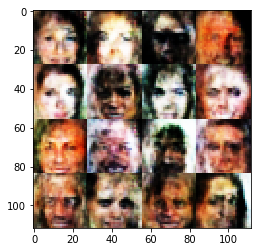

Epoch 0/2... Discriminator Loss: 0.8243... Generator Loss: 1.8697
Epoch 0/2... Discriminator Loss: 0.6911... Generator Loss: 1.6475
Epoch 0/2... Discriminator Loss: 0.9353... Generator Loss: 1.4446
Epoch 0/2... Discriminator Loss: 0.7452... Generator Loss: 1.4705
Epoch 0/2... Discriminator Loss: 0.7635... Generator Loss: 1.8077


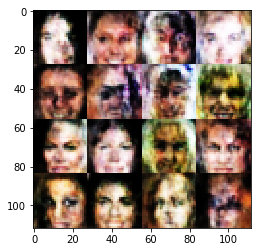

Epoch 0/2... Discriminator Loss: 0.8271... Generator Loss: 1.3744
Epoch 0/2... Discriminator Loss: 0.8758... Generator Loss: 1.4456
Epoch 0/2... Discriminator Loss: 0.6889... Generator Loss: 1.8045
Epoch 0/2... Discriminator Loss: 1.0088... Generator Loss: 1.3323
Epoch 0/2... Discriminator Loss: 0.8078... Generator Loss: 1.1977


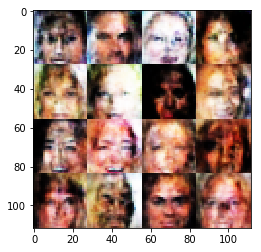

Epoch 0/2... Discriminator Loss: 0.7758... Generator Loss: 1.9044
Epoch 0/2... Discriminator Loss: 0.7610... Generator Loss: 1.4579
Epoch 0/2... Discriminator Loss: 0.6819... Generator Loss: 1.6458
Epoch 0/2... Discriminator Loss: 0.7338... Generator Loss: 1.6081
Epoch 0/2... Discriminator Loss: 0.9485... Generator Loss: 1.2989


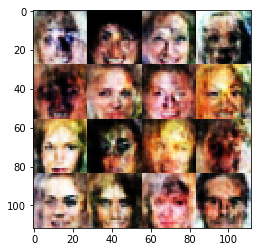

Epoch 0/2... Discriminator Loss: 1.0996... Generator Loss: 1.3756
Epoch 0/2... Discriminator Loss: 0.8163... Generator Loss: 1.4819
Epoch 0/2... Discriminator Loss: 1.2613... Generator Loss: 1.1112
Epoch 0/2... Discriminator Loss: 0.8374... Generator Loss: 1.5076
Epoch 0/2... Discriminator Loss: 0.6091... Generator Loss: 2.3075


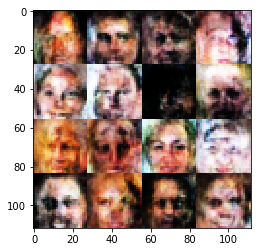

Epoch 0/2... Discriminator Loss: 0.9210... Generator Loss: 1.4664
Epoch 0/2... Discriminator Loss: 0.7969... Generator Loss: 1.6183
Epoch 0/2... Discriminator Loss: 0.9902... Generator Loss: 1.2094
Epoch 0/2... Discriminator Loss: 0.9480... Generator Loss: 1.3995
Epoch 0/2... Discriminator Loss: 0.8611... Generator Loss: 1.5084


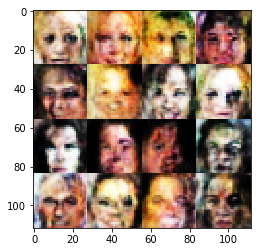

Epoch 0/2... Discriminator Loss: 1.1938... Generator Loss: 1.0527
Epoch 0/2... Discriminator Loss: 0.7673... Generator Loss: 1.4630
Epoch 0/2... Discriminator Loss: 0.6842... Generator Loss: 1.7309
Epoch 0/2... Discriminator Loss: 1.2016... Generator Loss: 0.9644
Epoch 0/2... Discriminator Loss: 0.8989... Generator Loss: 1.4951


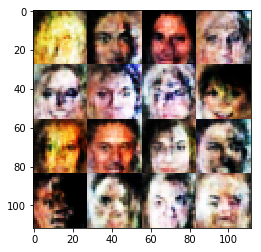

Epoch 0/2... Discriminator Loss: 0.7481... Generator Loss: 2.4363
Epoch 0/2... Discriminator Loss: 0.9000... Generator Loss: 1.6236
Epoch 0/2... Discriminator Loss: 0.9473... Generator Loss: 1.2488
Epoch 0/2... Discriminator Loss: 0.9071... Generator Loss: 1.5893
Epoch 0/2... Discriminator Loss: 0.8675... Generator Loss: 1.6135


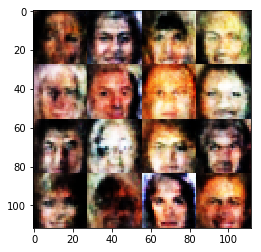

Epoch 0/2... Discriminator Loss: 0.6705... Generator Loss: 2.4288
Epoch 0/2... Discriminator Loss: 0.7550... Generator Loss: 1.7780
Epoch 0/2... Discriminator Loss: 0.8706... Generator Loss: 1.3249
Epoch 1/2... Discriminator Loss: 0.9660... Generator Loss: 0.9274
Epoch 1/2... Discriminator Loss: 0.7314... Generator Loss: 1.9680


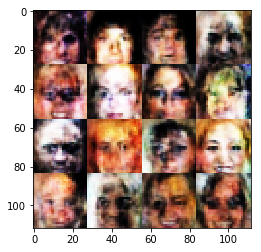

Epoch 1/2... Discriminator Loss: 1.0167... Generator Loss: 0.9141
Epoch 1/2... Discriminator Loss: 0.8469... Generator Loss: 1.6350
Epoch 1/2... Discriminator Loss: 0.9546... Generator Loss: 1.5308
Epoch 1/2... Discriminator Loss: 0.8174... Generator Loss: 1.6252
Epoch 1/2... Discriminator Loss: 0.8784... Generator Loss: 1.4118


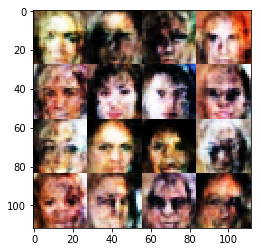

Epoch 1/2... Discriminator Loss: 0.9724... Generator Loss: 1.6566
Epoch 1/2... Discriminator Loss: 0.8986... Generator Loss: 1.7919
Epoch 1/2... Discriminator Loss: 0.9562... Generator Loss: 1.3424
Epoch 1/2... Discriminator Loss: 0.9212... Generator Loss: 1.2289
Epoch 1/2... Discriminator Loss: 0.7633... Generator Loss: 1.4639


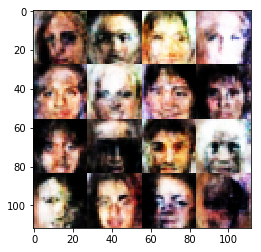

Epoch 1/2... Discriminator Loss: 1.0223... Generator Loss: 1.2179
Epoch 1/2... Discriminator Loss: 0.7867... Generator Loss: 1.2165
Epoch 1/2... Discriminator Loss: 1.0424... Generator Loss: 1.4079
Epoch 1/2... Discriminator Loss: 0.8848... Generator Loss: 1.6090
Epoch 1/2... Discriminator Loss: 0.8531... Generator Loss: 1.7422


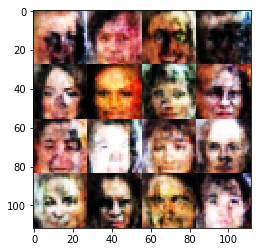

Epoch 1/2... Discriminator Loss: 0.7834... Generator Loss: 1.3668
Epoch 1/2... Discriminator Loss: 0.6634... Generator Loss: 2.1152
Epoch 1/2... Discriminator Loss: 0.8415... Generator Loss: 1.4771
Epoch 1/2... Discriminator Loss: 0.9848... Generator Loss: 2.0145
Epoch 1/2... Discriminator Loss: 0.8017... Generator Loss: 1.3268


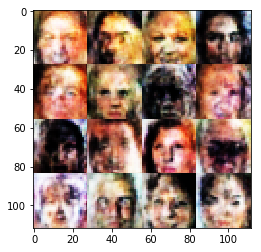

Epoch 1/2... Discriminator Loss: 0.8624... Generator Loss: 1.6383
Epoch 1/2... Discriminator Loss: 0.7237... Generator Loss: 1.5481
Epoch 1/2... Discriminator Loss: 1.0919... Generator Loss: 0.9930
Epoch 1/2... Discriminator Loss: 0.7020... Generator Loss: 1.5471
Epoch 1/2... Discriminator Loss: 0.9906... Generator Loss: 1.8893


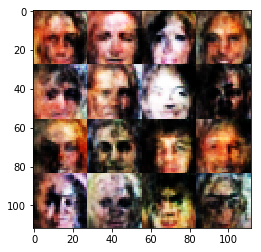

Epoch 1/2... Discriminator Loss: 0.7452... Generator Loss: 1.8086
Epoch 1/2... Discriminator Loss: 1.0230... Generator Loss: 1.4182
Epoch 1/2... Discriminator Loss: 0.8125... Generator Loss: 1.5218
Epoch 1/2... Discriminator Loss: 0.8666... Generator Loss: 1.6198
Epoch 1/2... Discriminator Loss: 0.8072... Generator Loss: 2.3677


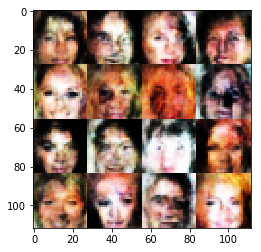

Epoch 1/2... Discriminator Loss: 0.6178... Generator Loss: 2.4797
Epoch 1/2... Discriminator Loss: 1.0067... Generator Loss: 1.5965
Epoch 1/2... Discriminator Loss: 0.7708... Generator Loss: 1.4876
Epoch 1/2... Discriminator Loss: 0.7212... Generator Loss: 1.8960
Epoch 1/2... Discriminator Loss: 1.0315... Generator Loss: 1.1008


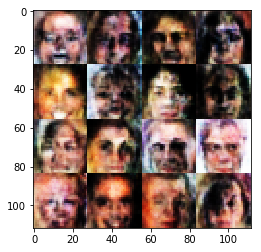

Epoch 1/2... Discriminator Loss: 0.6212... Generator Loss: 2.5426
Epoch 1/2... Discriminator Loss: 0.8292... Generator Loss: 2.0062
Epoch 1/2... Discriminator Loss: 0.9033... Generator Loss: 1.8900
Epoch 1/2... Discriminator Loss: 0.8161... Generator Loss: 1.7707
Epoch 1/2... Discriminator Loss: 0.6339... Generator Loss: 2.2719


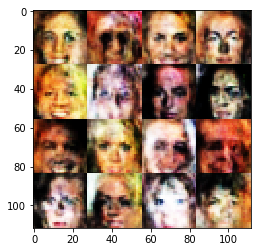

Epoch 1/2... Discriminator Loss: 0.9158... Generator Loss: 1.6128
Epoch 1/2... Discriminator Loss: 0.7792... Generator Loss: 1.5510
Epoch 1/2... Discriminator Loss: 0.8826... Generator Loss: 1.6629
Epoch 1/2... Discriminator Loss: 0.9099... Generator Loss: 1.8677
Epoch 1/2... Discriminator Loss: 0.7417... Generator Loss: 1.6638


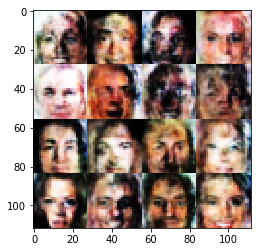

Epoch 1/2... Discriminator Loss: 0.8016... Generator Loss: 2.1351
Epoch 1/2... Discriminator Loss: 0.8492... Generator Loss: 1.3807
Epoch 1/2... Discriminator Loss: 0.8393... Generator Loss: 1.4604
Epoch 1/2... Discriminator Loss: 0.6366... Generator Loss: 2.1159
Epoch 1/2... Discriminator Loss: 1.0413... Generator Loss: 1.1004


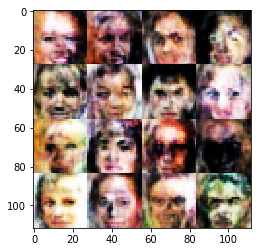

Epoch 1/2... Discriminator Loss: 0.7356... Generator Loss: 1.4816
Epoch 1/2... Discriminator Loss: 0.9952... Generator Loss: 0.9033
Epoch 1/2... Discriminator Loss: 0.6649... Generator Loss: 2.2217
Epoch 1/2... Discriminator Loss: 0.7560... Generator Loss: 1.5329
Epoch 1/2... Discriminator Loss: 0.9378... Generator Loss: 1.4247


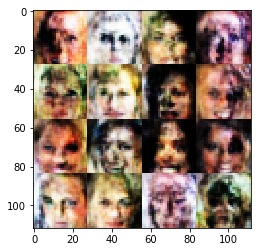

Epoch 1/2... Discriminator Loss: 0.7520... Generator Loss: 1.6404
Epoch 1/2... Discriminator Loss: 0.7120... Generator Loss: 1.7271
Epoch 1/2... Discriminator Loss: 1.0226... Generator Loss: 2.0223
Epoch 1/2... Discriminator Loss: 0.9432... Generator Loss: 1.5083
Epoch 1/2... Discriminator Loss: 0.9315... Generator Loss: 1.5096


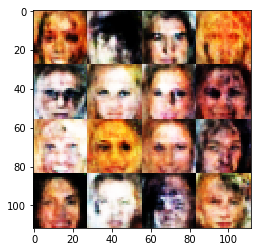

Epoch 1/2... Discriminator Loss: 0.9787... Generator Loss: 1.5776
Epoch 1/2... Discriminator Loss: 0.9286... Generator Loss: 1.6620
Epoch 1/2... Discriminator Loss: 0.8052... Generator Loss: 2.3497
Epoch 1/2... Discriminator Loss: 0.8532... Generator Loss: 1.4996
Epoch 1/2... Discriminator Loss: 1.0441... Generator Loss: 1.5023


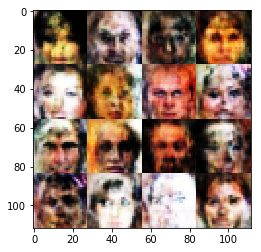

Epoch 1/2... Discriminator Loss: 1.0034... Generator Loss: 1.1674
Epoch 1/2... Discriminator Loss: 0.7384... Generator Loss: 1.5750
Epoch 1/2... Discriminator Loss: 0.8383... Generator Loss: 1.7159
Epoch 1/2... Discriminator Loss: 0.7565... Generator Loss: 1.5325
Epoch 1/2... Discriminator Loss: 0.8051... Generator Loss: 1.3897


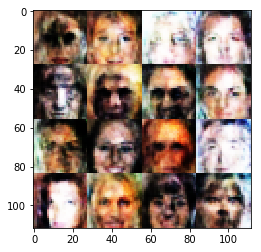

Epoch 1/2... Discriminator Loss: 0.9214... Generator Loss: 1.0839
Epoch 1/2... Discriminator Loss: 0.8341... Generator Loss: 2.0168
Epoch 1/2... Discriminator Loss: 0.8832... Generator Loss: 1.8757
Epoch 1/2... Discriminator Loss: 0.9887... Generator Loss: 1.0584
Epoch 1/2... Discriminator Loss: 0.8396... Generator Loss: 1.1732


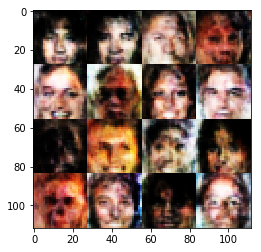

Epoch 1/2... Discriminator Loss: 1.0043... Generator Loss: 1.7123
Epoch 1/2... Discriminator Loss: 0.7231... Generator Loss: 1.5394
Epoch 1/2... Discriminator Loss: 0.8657... Generator Loss: 1.4368
Epoch 1/2... Discriminator Loss: 0.9346... Generator Loss: 1.5334
Epoch 1/2... Discriminator Loss: 0.6145... Generator Loss: 1.8634


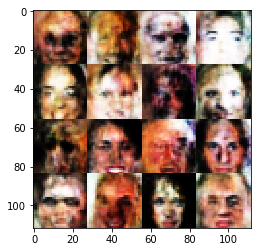

Epoch 1/2... Discriminator Loss: 0.8628... Generator Loss: 2.1411
Epoch 1/2... Discriminator Loss: 1.0193... Generator Loss: 1.4614
Epoch 1/2... Discriminator Loss: 0.8831... Generator Loss: 1.3990
Epoch 1/2... Discriminator Loss: 0.8774... Generator Loss: 1.3693
Epoch 1/2... Discriminator Loss: 0.7484... Generator Loss: 1.7045


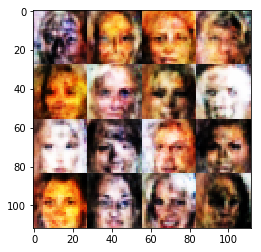

Epoch 1/2... Discriminator Loss: 0.8841... Generator Loss: 1.7050
Epoch 1/2... Discriminator Loss: 0.9270... Generator Loss: 1.4808
Epoch 1/2... Discriminator Loss: 0.7013... Generator Loss: 1.4497
Epoch 1/2... Discriminator Loss: 0.8569... Generator Loss: 1.4673
Epoch 1/2... Discriminator Loss: 0.8211... Generator Loss: 1.5587


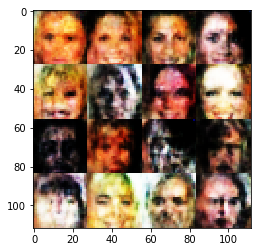

Epoch 1/2... Discriminator Loss: 0.8404... Generator Loss: 2.2838
Epoch 1/2... Discriminator Loss: 0.8893... Generator Loss: 1.6610
Epoch 1/2... Discriminator Loss: 0.8561... Generator Loss: 1.4941
Epoch 1/2... Discriminator Loss: 0.7489... Generator Loss: 2.2515
Epoch 1/2... Discriminator Loss: 1.0821... Generator Loss: 0.8365


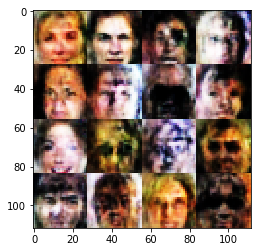

Epoch 1/2... Discriminator Loss: 0.7974... Generator Loss: 1.4022
Epoch 1/2... Discriminator Loss: 1.0369... Generator Loss: 2.2247
Epoch 1/2... Discriminator Loss: 0.8801... Generator Loss: 1.2607
Epoch 1/2... Discriminator Loss: 0.6277... Generator Loss: 2.6573
Epoch 1/2... Discriminator Loss: 0.7612... Generator Loss: 1.6491


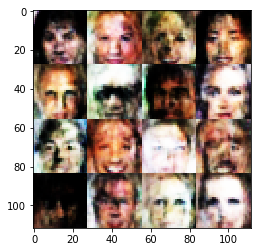

Epoch 1/2... Discriminator Loss: 0.9728... Generator Loss: 0.9614
Epoch 1/2... Discriminator Loss: 0.8431... Generator Loss: 1.8526
Epoch 1/2... Discriminator Loss: 1.0463... Generator Loss: 1.3139
Epoch 1/2... Discriminator Loss: 1.0777... Generator Loss: 1.3023
Epoch 1/2... Discriminator Loss: 0.7857... Generator Loss: 2.0182


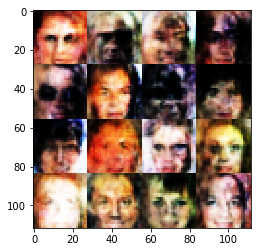

Epoch 1/2... Discriminator Loss: 0.8829... Generator Loss: 1.5211
Epoch 1/2... Discriminator Loss: 1.0199... Generator Loss: 1.6895
Epoch 1/2... Discriminator Loss: 0.8355... Generator Loss: 2.5643
Epoch 1/2... Discriminator Loss: 0.6140... Generator Loss: 1.8650
Epoch 1/2... Discriminator Loss: 0.8886... Generator Loss: 1.2601


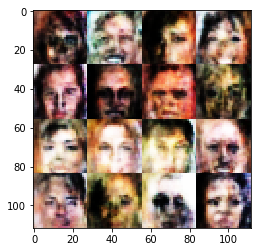

Epoch 1/2... Discriminator Loss: 0.7678... Generator Loss: 2.0239
Epoch 1/2... Discriminator Loss: 1.0059... Generator Loss: 1.6044
Epoch 1/2... Discriminator Loss: 0.8665... Generator Loss: 1.5782
Epoch 1/2... Discriminator Loss: 0.9373... Generator Loss: 1.2363
Epoch 1/2... Discriminator Loss: 1.0843... Generator Loss: 1.4765


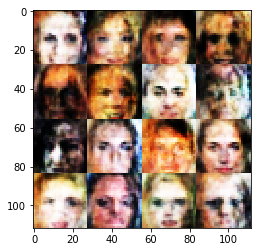

Epoch 1/2... Discriminator Loss: 0.8271... Generator Loss: 2.0838
Epoch 1/2... Discriminator Loss: 0.9694... Generator Loss: 1.3971
Epoch 1/2... Discriminator Loss: 0.6678... Generator Loss: 2.3615
Epoch 1/2... Discriminator Loss: 0.7023... Generator Loss: 1.7994
Epoch 1/2... Discriminator Loss: 0.7326... Generator Loss: 2.0201


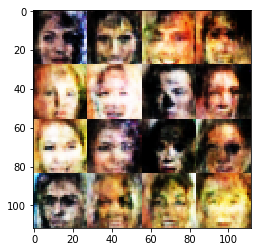

Epoch 1/2... Discriminator Loss: 0.7032... Generator Loss: 2.2387
Epoch 1/2... Discriminator Loss: 0.9008... Generator Loss: 1.3954
Epoch 1/2... Discriminator Loss: 0.9801... Generator Loss: 1.9632
Epoch 1/2... Discriminator Loss: 0.9080... Generator Loss: 1.1894
Epoch 1/2... Discriminator Loss: 0.8945... Generator Loss: 1.4387


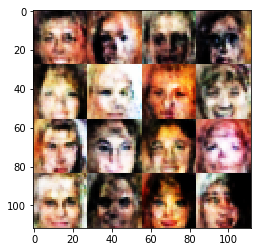

Epoch 1/2... Discriminator Loss: 0.8040... Generator Loss: 2.0175
Epoch 1/2... Discriminator Loss: 0.7993... Generator Loss: 1.8114
Epoch 1/2... Discriminator Loss: 0.8555... Generator Loss: 1.8488
Epoch 1/2... Discriminator Loss: 0.9867... Generator Loss: 1.1344
Epoch 1/2... Discriminator Loss: 0.7914... Generator Loss: 2.3432


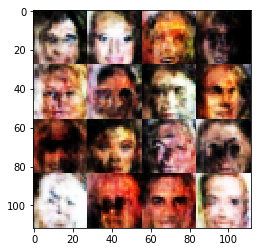

Epoch 1/2... Discriminator Loss: 0.6463... Generator Loss: 1.8819
Epoch 1/2... Discriminator Loss: 0.7383... Generator Loss: 2.7708
Epoch 1/2... Discriminator Loss: 0.8583... Generator Loss: 1.9636
Epoch 1/2... Discriminator Loss: 0.8476... Generator Loss: 1.1251
Epoch 1/2... Discriminator Loss: 0.8031... Generator Loss: 1.6492


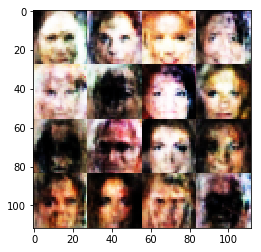

Epoch 1/2... Discriminator Loss: 0.7770... Generator Loss: 1.1001
Epoch 1/2... Discriminator Loss: 0.8227... Generator Loss: 1.7538
Epoch 1/2... Discriminator Loss: 1.0517... Generator Loss: 1.2610
Epoch 1/2... Discriminator Loss: 0.9495... Generator Loss: 1.4609
Epoch 1/2... Discriminator Loss: 0.7896... Generator Loss: 1.6920


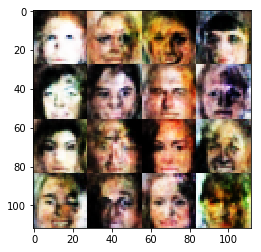

Epoch 1/2... Discriminator Loss: 0.7813... Generator Loss: 1.8412
Epoch 1/2... Discriminator Loss: 0.9256... Generator Loss: 1.2336
Epoch 1/2... Discriminator Loss: 1.2038... Generator Loss: 0.7135
Epoch 1/2... Discriminator Loss: 0.9927... Generator Loss: 1.1056
Epoch 1/2... Discriminator Loss: 0.6940... Generator Loss: 2.4282


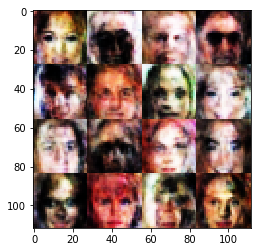

Epoch 1/2... Discriminator Loss: 0.8358... Generator Loss: 1.2463
Epoch 1/2... Discriminator Loss: 0.6843... Generator Loss: 1.6788
Epoch 1/2... Discriminator Loss: 0.7465... Generator Loss: 2.0852
Epoch 1/2... Discriminator Loss: 1.1529... Generator Loss: 1.1636
Epoch 1/2... Discriminator Loss: 1.1382... Generator Loss: 1.2471


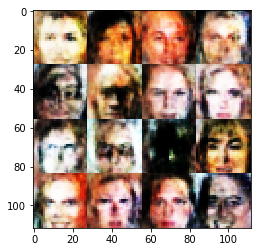

Epoch 1/2... Discriminator Loss: 0.7759... Generator Loss: 1.6228
Epoch 1/2... Discriminator Loss: 1.1098... Generator Loss: 1.0936
Epoch 1/2... Discriminator Loss: 0.7955... Generator Loss: 1.3800
Epoch 1/2... Discriminator Loss: 0.9547... Generator Loss: 0.8931
Epoch 1/2... Discriminator Loss: 0.8258... Generator Loss: 1.1746


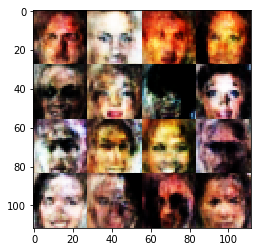

Epoch 1/2... Discriminator Loss: 1.0579... Generator Loss: 1.5706
Epoch 1/2... Discriminator Loss: 0.8912... Generator Loss: 1.9264
Epoch 1/2... Discriminator Loss: 0.9102... Generator Loss: 1.2494
Epoch 1/2... Discriminator Loss: 0.7906... Generator Loss: 1.8978
Epoch 1/2... Discriminator Loss: 0.9290... Generator Loss: 1.2655


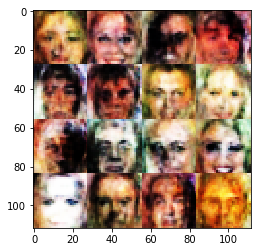

Epoch 1/2... Discriminator Loss: 0.7941... Generator Loss: 1.3227
Epoch 1/2... Discriminator Loss: 0.8540... Generator Loss: 1.4138
Epoch 1/2... Discriminator Loss: 0.7180... Generator Loss: 2.5464
Epoch 1/2... Discriminator Loss: 0.8418... Generator Loss: 1.4533
Epoch 1/2... Discriminator Loss: 0.6751... Generator Loss: 2.3329


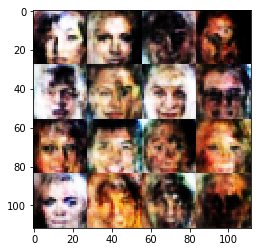

Epoch 1/2... Discriminator Loss: 0.7966... Generator Loss: 1.6013
Epoch 1/2... Discriminator Loss: 0.7808... Generator Loss: 1.3283
Epoch 1/2... Discriminator Loss: 0.7583... Generator Loss: 2.0550
Epoch 1/2... Discriminator Loss: 0.8451... Generator Loss: 1.6822
Epoch 1/2... Discriminator Loss: 0.7545... Generator Loss: 1.9737


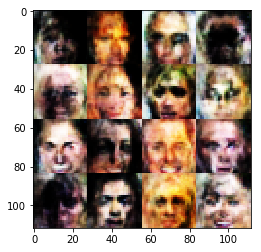

Epoch 1/2... Discriminator Loss: 1.0137... Generator Loss: 1.1549
Epoch 1/2... Discriminator Loss: 0.8729... Generator Loss: 1.8664
Epoch 1/2... Discriminator Loss: 0.9607... Generator Loss: 1.5563
Epoch 1/2... Discriminator Loss: 0.8584... Generator Loss: 1.5230
Epoch 1/2... Discriminator Loss: 1.0848... Generator Loss: 1.1527


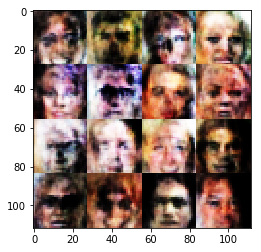

Epoch 1/2... Discriminator Loss: 0.9456... Generator Loss: 1.5886
Epoch 1/2... Discriminator Loss: 0.6938... Generator Loss: 2.2183
Epoch 1/2... Discriminator Loss: 0.9409... Generator Loss: 1.4344
Epoch 1/2... Discriminator Loss: 0.7346... Generator Loss: 1.9777
Epoch 1/2... Discriminator Loss: 0.8856... Generator Loss: 2.0016


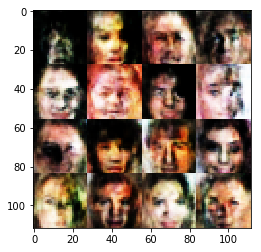

Epoch 1/2... Discriminator Loss: 1.1981... Generator Loss: 1.0393
Epoch 1/2... Discriminator Loss: 0.8603... Generator Loss: 1.6303
Epoch 1/2... Discriminator Loss: 0.8114... Generator Loss: 1.4335
Epoch 1/2... Discriminator Loss: 0.7751... Generator Loss: 1.3932
Epoch 1/2... Discriminator Loss: 1.1295... Generator Loss: 1.7009


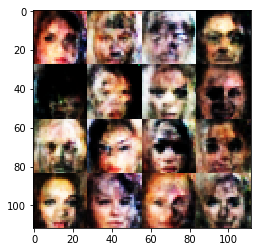

Epoch 1/2... Discriminator Loss: 0.8282... Generator Loss: 1.6459
Epoch 1/2... Discriminator Loss: 1.2239... Generator Loss: 1.2153
Epoch 1/2... Discriminator Loss: 0.5880... Generator Loss: 2.4673
Epoch 1/2... Discriminator Loss: 0.7503... Generator Loss: 1.6764
Epoch 1/2... Discriminator Loss: 0.7862... Generator Loss: 1.3449


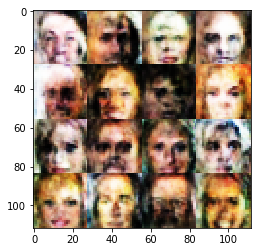

Epoch 1/2... Discriminator Loss: 0.7664... Generator Loss: 2.0443
Epoch 1/2... Discriminator Loss: 1.4871... Generator Loss: 1.0550
Epoch 1/2... Discriminator Loss: 0.6811... Generator Loss: 2.6469
Epoch 1/2... Discriminator Loss: 0.9086... Generator Loss: 1.7494
Epoch 1/2... Discriminator Loss: 0.8031... Generator Loss: 1.3351


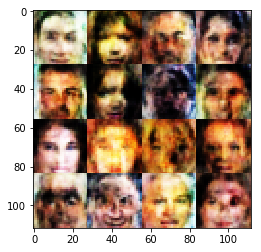

Epoch 1/2... Discriminator Loss: 0.8168... Generator Loss: 1.8582
Epoch 1/2... Discriminator Loss: 0.7311... Generator Loss: 1.1066
Epoch 1/2... Discriminator Loss: 1.1350... Generator Loss: 0.9737
Epoch 1/2... Discriminator Loss: 1.0305... Generator Loss: 1.2598
Epoch 1/2... Discriminator Loss: 1.6612... Generator Loss: 0.7300


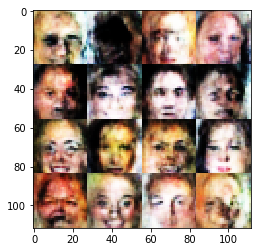

Epoch 1/2... Discriminator Loss: 1.0714... Generator Loss: 1.3103
Epoch 1/2... Discriminator Loss: 0.8859... Generator Loss: 1.6722
Epoch 1/2... Discriminator Loss: 0.7295... Generator Loss: 2.7988
Epoch 1/2... Discriminator Loss: 0.8014... Generator Loss: 1.9847
Epoch 1/2... Discriminator Loss: 0.7729... Generator Loss: 1.5353


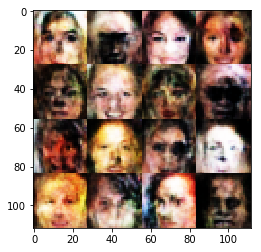

Epoch 1/2... Discriminator Loss: 1.0869... Generator Loss: 1.2356
Epoch 1/2... Discriminator Loss: 0.8716... Generator Loss: 1.6051
Epoch 1/2... Discriminator Loss: 0.8077... Generator Loss: 1.4761
Epoch 1/2... Discriminator Loss: 1.0311... Generator Loss: 2.3080
Epoch 1/2... Discriminator Loss: 0.9079... Generator Loss: 1.6411


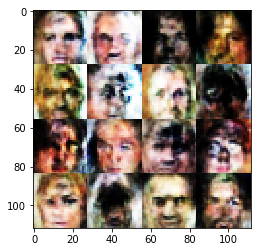

Epoch 1/2... Discriminator Loss: 1.0180... Generator Loss: 1.4533
Epoch 1/2... Discriminator Loss: 1.0460... Generator Loss: 0.9467
Epoch 1/2... Discriminator Loss: 0.7702... Generator Loss: 1.4751
Epoch 1/2... Discriminator Loss: 0.8017... Generator Loss: 2.0327
Epoch 1/2... Discriminator Loss: 0.8272... Generator Loss: 1.9625


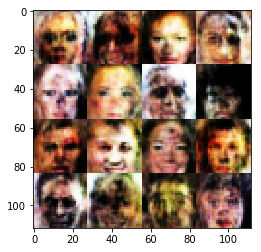

Epoch 1/2... Discriminator Loss: 0.7973... Generator Loss: 1.4623
Epoch 1/2... Discriminator Loss: 0.9034... Generator Loss: 1.9563
Epoch 1/2... Discriminator Loss: 0.9428... Generator Loss: 1.4958
Epoch 1/2... Discriminator Loss: 1.1280... Generator Loss: 1.3599
Epoch 1/2... Discriminator Loss: 0.8844... Generator Loss: 1.2913


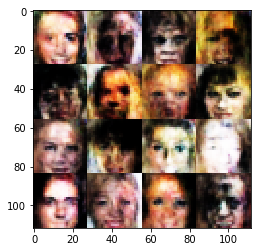

Epoch 1/2... Discriminator Loss: 0.9675... Generator Loss: 1.1608
Epoch 1/2... Discriminator Loss: 0.6961... Generator Loss: 1.7671
Epoch 1/2... Discriminator Loss: 0.8475... Generator Loss: 1.5393
Epoch 1/2... Discriminator Loss: 1.1522... Generator Loss: 1.0731
Epoch 1/2... Discriminator Loss: 0.7256... Generator Loss: 2.1563


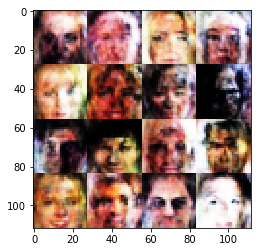

Epoch 1/2... Discriminator Loss: 0.9853... Generator Loss: 1.0451
Epoch 1/2... Discriminator Loss: 0.7256... Generator Loss: 1.7484
Epoch 1/2... Discriminator Loss: 0.8552... Generator Loss: 1.7149
Epoch 1/2... Discriminator Loss: 0.7707... Generator Loss: 1.3917
Epoch 1/2... Discriminator Loss: 0.7696... Generator Loss: 2.2949


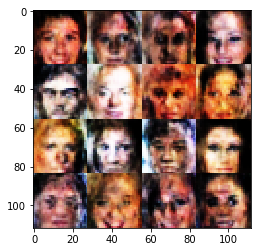

Epoch 1/2... Discriminator Loss: 0.8407... Generator Loss: 1.8088
Epoch 1/2... Discriminator Loss: 0.9900... Generator Loss: 1.3230
Epoch 1/2... Discriminator Loss: 0.8969... Generator Loss: 1.2175
Epoch 1/2... Discriminator Loss: 0.9006... Generator Loss: 1.6163
Epoch 1/2... Discriminator Loss: 0.7170... Generator Loss: 1.5465


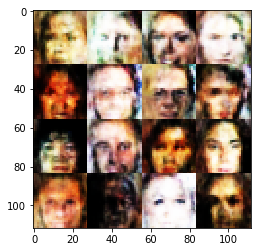

Epoch 1/2... Discriminator Loss: 1.1283... Generator Loss: 1.1163
Epoch 1/2... Discriminator Loss: 0.9466... Generator Loss: 1.5644
Epoch 1/2... Discriminator Loss: 1.0124... Generator Loss: 1.2954
Epoch 1/2... Discriminator Loss: 0.7385... Generator Loss: 1.4955
Epoch 1/2... Discriminator Loss: 0.7690... Generator Loss: 1.9321


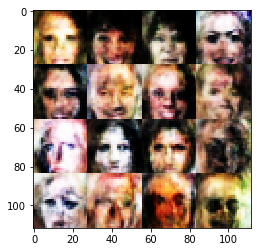

Epoch 1/2... Discriminator Loss: 0.8256... Generator Loss: 1.6035
Epoch 1/2... Discriminator Loss: 0.7222... Generator Loss: 2.1345
Epoch 1/2... Discriminator Loss: 0.6926... Generator Loss: 2.0578
Epoch 1/2... Discriminator Loss: 0.9027... Generator Loss: 1.2074
Epoch 1/2... Discriminator Loss: 0.9385... Generator Loss: 1.7334


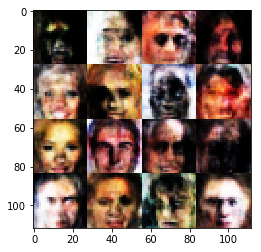

Epoch 1/2... Discriminator Loss: 0.7002... Generator Loss: 1.8954
Epoch 1/2... Discriminator Loss: 0.7308... Generator Loss: 1.9638
Epoch 1/2... Discriminator Loss: 1.1302... Generator Loss: 1.6395
Epoch 1/2... Discriminator Loss: 0.6663... Generator Loss: 2.5406
Epoch 1/2... Discriminator Loss: 0.7486... Generator Loss: 1.7950


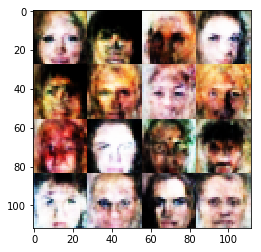

Epoch 1/2... Discriminator Loss: 1.1560... Generator Loss: 2.1446
Epoch 1/2... Discriminator Loss: 0.7693... Generator Loss: 1.9161
Epoch 1/2... Discriminator Loss: 0.5464... Generator Loss: 2.9809
Epoch 1/2... Discriminator Loss: 1.2393... Generator Loss: 0.9033
Epoch 1/2... Discriminator Loss: 0.9485... Generator Loss: 1.2842


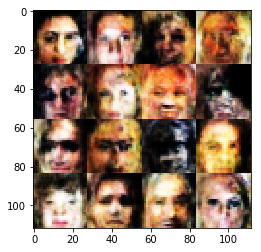

Epoch 1/2... Discriminator Loss: 0.7572... Generator Loss: 1.8358
Epoch 1/2... Discriminator Loss: 0.8988... Generator Loss: 1.7295
Epoch 1/2... Discriminator Loss: 1.0746... Generator Loss: 1.3656
Epoch 1/2... Discriminator Loss: 0.8652... Generator Loss: 1.2772
Epoch 1/2... Discriminator Loss: 0.7632... Generator Loss: 1.4988


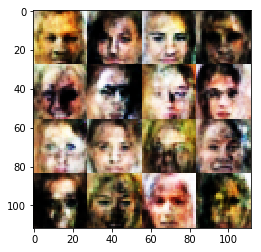

Epoch 1/2... Discriminator Loss: 0.7495... Generator Loss: 2.2858
Epoch 1/2... Discriminator Loss: 0.9108... Generator Loss: 1.5313
Epoch 1/2... Discriminator Loss: 0.6929... Generator Loss: 1.1769
Epoch 1/2... Discriminator Loss: 0.6729... Generator Loss: 2.3855
Epoch 1/2... Discriminator Loss: 0.6909... Generator Loss: 1.8032


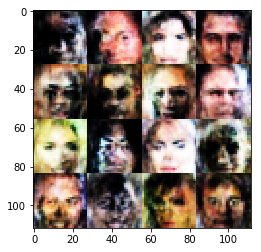

Epoch 1/2... Discriminator Loss: 0.8020... Generator Loss: 1.7704
Epoch 1/2... Discriminator Loss: 1.0048... Generator Loss: 1.2336
Epoch 1/2... Discriminator Loss: 0.9400... Generator Loss: 1.4440
Epoch 1/2... Discriminator Loss: 0.8214... Generator Loss: 1.6710
Epoch 1/2... Discriminator Loss: 0.9071... Generator Loss: 1.7030


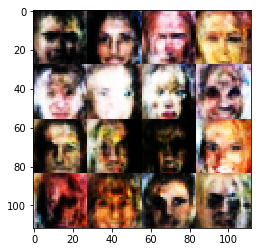

Epoch 1/2... Discriminator Loss: 1.0711... Generator Loss: 1.5829
Epoch 1/2... Discriminator Loss: 0.9336... Generator Loss: 1.4114
Epoch 1/2... Discriminator Loss: 0.7391... Generator Loss: 1.3011
Epoch 1/2... Discriminator Loss: 0.8807... Generator Loss: 1.7608
Epoch 1/2... Discriminator Loss: 0.7062... Generator Loss: 1.4588


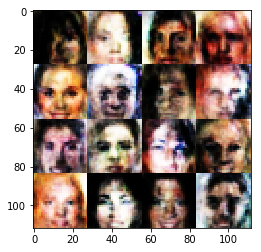

Epoch 1/2... Discriminator Loss: 0.7671... Generator Loss: 1.6865
Epoch 1/2... Discriminator Loss: 0.8786... Generator Loss: 1.3419
Epoch 1/2... Discriminator Loss: 1.1120... Generator Loss: 1.9638
Epoch 1/2... Discriminator Loss: 1.0668... Generator Loss: 0.8766
Epoch 1/2... Discriminator Loss: 0.7311... Generator Loss: 1.7451


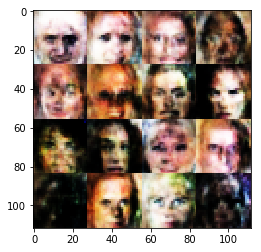

Epoch 1/2... Discriminator Loss: 0.8020... Generator Loss: 2.0564
Epoch 1/2... Discriminator Loss: 1.1145... Generator Loss: 0.9633
Epoch 1/2... Discriminator Loss: 0.9909... Generator Loss: 1.0956
Epoch 1/2... Discriminator Loss: 1.2042... Generator Loss: 1.7829
Epoch 1/2... Discriminator Loss: 0.8282... Generator Loss: 1.8171


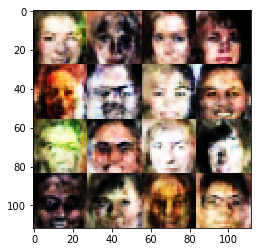

Epoch 1/2... Discriminator Loss: 0.8634... Generator Loss: 1.5651
Epoch 1/2... Discriminator Loss: 1.0549... Generator Loss: 1.5808
Epoch 1/2... Discriminator Loss: 0.8432... Generator Loss: 1.1389
Epoch 1/2... Discriminator Loss: 0.7964... Generator Loss: 1.9118
Epoch 1/2... Discriminator Loss: 0.9026... Generator Loss: 1.5775


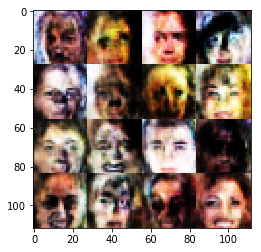

Epoch 1/2... Discriminator Loss: 0.8706... Generator Loss: 1.9484
Epoch 1/2... Discriminator Loss: 1.0941... Generator Loss: 1.8954
Epoch 1/2... Discriminator Loss: 0.6960... Generator Loss: 2.0971
Epoch 1/2... Discriminator Loss: 0.8653... Generator Loss: 1.4816
Epoch 1/2... Discriminator Loss: 0.7035... Generator Loss: 2.0003


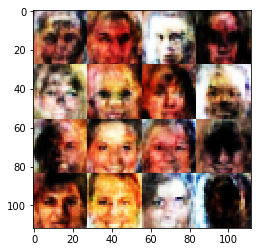

Epoch 1/2... Discriminator Loss: 1.0223... Generator Loss: 1.3570
Epoch 1/2... Discriminator Loss: 0.6887... Generator Loss: 2.3402
Epoch 1/2... Discriminator Loss: 0.9237... Generator Loss: 1.8188
Epoch 1/2... Discriminator Loss: 0.9083... Generator Loss: 1.5830
Epoch 1/2... Discriminator Loss: 0.7393... Generator Loss: 2.1394


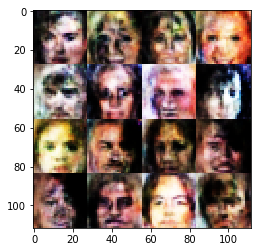

Epoch 1/2... Discriminator Loss: 0.7649... Generator Loss: 1.4935
Epoch 1/2... Discriminator Loss: 0.7099... Generator Loss: 2.0448
Epoch 1/2... Discriminator Loss: 0.7350... Generator Loss: 1.9523
Epoch 1/2... Discriminator Loss: 0.9600... Generator Loss: 1.2193
Epoch 1/2... Discriminator Loss: 0.7939... Generator Loss: 1.8140


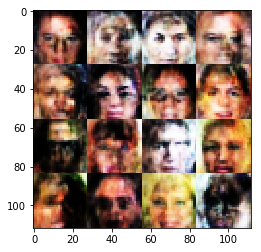

Epoch 1/2... Discriminator Loss: 0.8178... Generator Loss: 1.8031
Epoch 1/2... Discriminator Loss: 0.7742... Generator Loss: 1.9909
Epoch 1/2... Discriminator Loss: 0.9863... Generator Loss: 1.1355
Epoch 1/2... Discriminator Loss: 0.9679... Generator Loss: 1.4544
Epoch 1/2... Discriminator Loss: 0.6989... Generator Loss: 1.9353


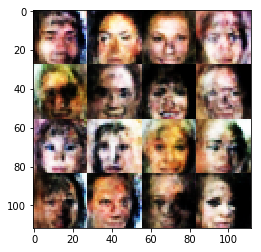

Epoch 1/2... Discriminator Loss: 0.8921... Generator Loss: 1.5268
Epoch 1/2... Discriminator Loss: 0.9060... Generator Loss: 1.5730
Epoch 1/2... Discriminator Loss: 0.8580... Generator Loss: 1.7892
Epoch 1/2... Discriminator Loss: 0.9411... Generator Loss: 1.3792
Epoch 1/2... Discriminator Loss: 0.8575... Generator Loss: 1.3971


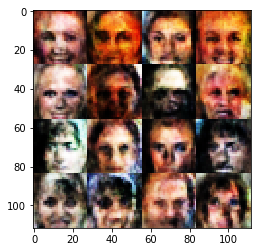

Epoch 1/2... Discriminator Loss: 0.9981... Generator Loss: 1.2778
Epoch 1/2... Discriminator Loss: 0.8646... Generator Loss: 1.6647
Epoch 1/2... Discriminator Loss: 1.0777... Generator Loss: 1.6048
Epoch 1/2... Discriminator Loss: 0.8490... Generator Loss: 1.7550
Epoch 1/2... Discriminator Loss: 0.9661... Generator Loss: 1.3538


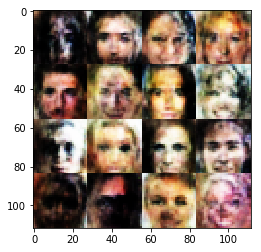

Epoch 1/2... Discriminator Loss: 0.6491... Generator Loss: 1.8969
Epoch 1/2... Discriminator Loss: 1.3994... Generator Loss: 0.7594
Epoch 1/2... Discriminator Loss: 0.7150... Generator Loss: 1.7281
Epoch 1/2... Discriminator Loss: 0.8073... Generator Loss: 1.5656
Epoch 1/2... Discriminator Loss: 0.7884... Generator Loss: 1.3650


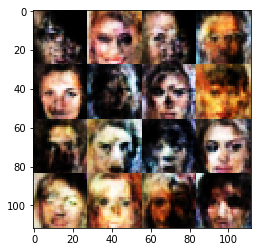

Epoch 1/2... Discriminator Loss: 0.9641... Generator Loss: 1.6266
Epoch 1/2... Discriminator Loss: 0.8071... Generator Loss: 2.3165
Epoch 1/2... Discriminator Loss: 1.2194... Generator Loss: 1.2751
Epoch 1/2... Discriminator Loss: 0.8886... Generator Loss: 1.5740
Epoch 1/2... Discriminator Loss: 0.7884... Generator Loss: 1.7859


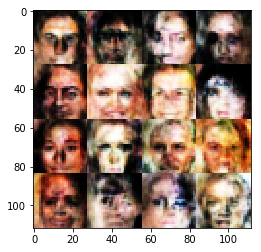

Epoch 1/2... Discriminator Loss: 0.8936... Generator Loss: 1.4883
Epoch 1/2... Discriminator Loss: 0.9494... Generator Loss: 2.0500
Epoch 1/2... Discriminator Loss: 0.8151... Generator Loss: 1.4807
Epoch 1/2... Discriminator Loss: 0.9229... Generator Loss: 1.1364
Epoch 1/2... Discriminator Loss: 0.6729... Generator Loss: 2.5138


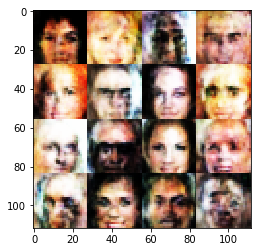

Epoch 1/2... Discriminator Loss: 1.1958... Generator Loss: 0.9216
Epoch 1/2... Discriminator Loss: 0.8942... Generator Loss: 1.1698
Epoch 1/2... Discriminator Loss: 0.6257... Generator Loss: 1.9281
Epoch 1/2... Discriminator Loss: 0.7394... Generator Loss: 1.8015
Epoch 1/2... Discriminator Loss: 1.0646... Generator Loss: 1.1704


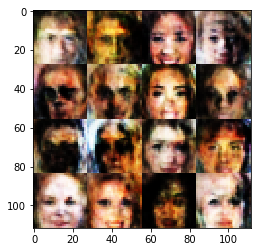

Epoch 1/2... Discriminator Loss: 1.1828... Generator Loss: 1.1705
Epoch 1/2... Discriminator Loss: 0.9317... Generator Loss: 2.2758
Epoch 1/2... Discriminator Loss: 1.0331... Generator Loss: 1.4840
Epoch 1/2... Discriminator Loss: 0.7660... Generator Loss: 1.1701
Epoch 1/2... Discriminator Loss: 0.8785... Generator Loss: 1.5221


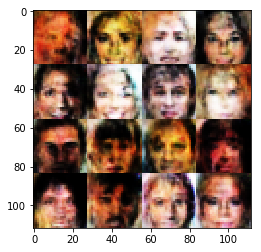

Epoch 1/2... Discriminator Loss: 0.9269... Generator Loss: 1.4798
Epoch 1/2... Discriminator Loss: 1.1136... Generator Loss: 1.3312
Epoch 1/2... Discriminator Loss: 0.8013... Generator Loss: 1.9589
Epoch 1/2... Discriminator Loss: 0.7937... Generator Loss: 2.3296
Epoch 1/2... Discriminator Loss: 0.8741... Generator Loss: 2.1013


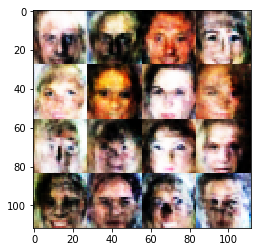

Epoch 1/2... Discriminator Loss: 1.0881... Generator Loss: 0.9824
Epoch 1/2... Discriminator Loss: 0.7556... Generator Loss: 1.5863
Epoch 1/2... Discriminator Loss: 0.6756... Generator Loss: 2.4028
Epoch 1/2... Discriminator Loss: 0.8177... Generator Loss: 1.8123
Epoch 1/2... Discriminator Loss: 0.8865... Generator Loss: 2.4508


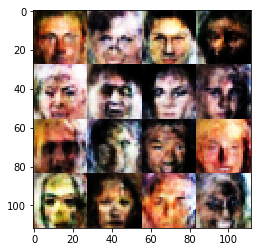

Epoch 1/2... Discriminator Loss: 0.9851... Generator Loss: 1.0351
Epoch 1/2... Discriminator Loss: 0.9175... Generator Loss: 1.7911
Epoch 1/2... Discriminator Loss: 0.9302... Generator Loss: 1.4781
Epoch 1/2... Discriminator Loss: 0.9711... Generator Loss: 1.7270
Epoch 1/2... Discriminator Loss: 0.9767... Generator Loss: 1.3239


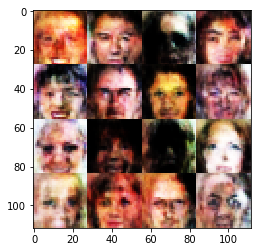

Epoch 1/2... Discriminator Loss: 1.0199... Generator Loss: 1.3781
Epoch 1/2... Discriminator Loss: 0.9646... Generator Loss: 1.1149
Epoch 1/2... Discriminator Loss: 0.9039... Generator Loss: 1.3740
Epoch 1/2... Discriminator Loss: 0.9151... Generator Loss: 1.1838
Epoch 1/2... Discriminator Loss: 0.8705... Generator Loss: 1.2890


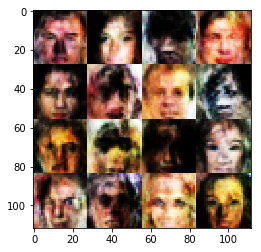

Epoch 1/2... Discriminator Loss: 0.9620... Generator Loss: 1.5949
Epoch 1/2... Discriminator Loss: 0.9443... Generator Loss: 1.4271
Epoch 1/2... Discriminator Loss: 0.8023... Generator Loss: 1.6538
Epoch 1/2... Discriminator Loss: 0.9676... Generator Loss: 1.9650
Epoch 1/2... Discriminator Loss: 0.7661... Generator Loss: 1.6349


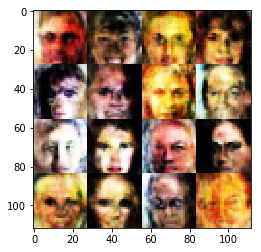

Epoch 1/2... Discriminator Loss: 0.9165... Generator Loss: 1.5103
Epoch 1/2... Discriminator Loss: 0.7148... Generator Loss: 1.8580
Epoch 1/2... Discriminator Loss: 0.9356... Generator Loss: 1.2062
Epoch 1/2... Discriminator Loss: 0.8280... Generator Loss: 1.6429
Epoch 1/2... Discriminator Loss: 0.9111... Generator Loss: 1.4290


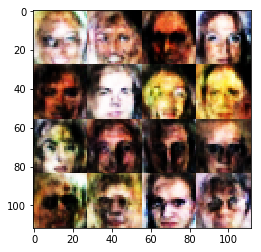

Epoch 1/2... Discriminator Loss: 0.8952... Generator Loss: 1.1953
Epoch 1/2... Discriminator Loss: 0.8599... Generator Loss: 2.1965
Epoch 1/2... Discriminator Loss: 0.7826... Generator Loss: 1.4346
Epoch 1/2... Discriminator Loss: 0.7952... Generator Loss: 1.2440
Epoch 1/2... Discriminator Loss: 0.9498... Generator Loss: 1.3764


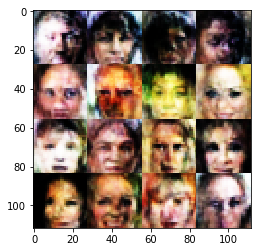

Epoch 1/2... Discriminator Loss: 0.8069... Generator Loss: 1.4640
Epoch 1/2... Discriminator Loss: 0.8085... Generator Loss: 2.0314
Epoch 1/2... Discriminator Loss: 1.3113... Generator Loss: 0.8964
Epoch 1/2... Discriminator Loss: 0.7666... Generator Loss: 2.3869
Epoch 1/2... Discriminator Loss: 0.8002... Generator Loss: 1.4878


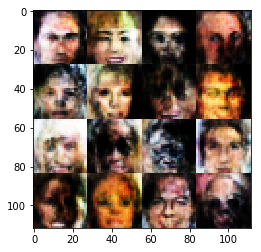

Epoch 1/2... Discriminator Loss: 0.8163... Generator Loss: 1.0107
Epoch 1/2... Discriminator Loss: 0.8263... Generator Loss: 1.9278
Epoch 1/2... Discriminator Loss: 1.0054... Generator Loss: 1.4932
Epoch 1/2... Discriminator Loss: 0.9678... Generator Loss: 1.9177
Epoch 1/2... Discriminator Loss: 0.7535... Generator Loss: 2.1292


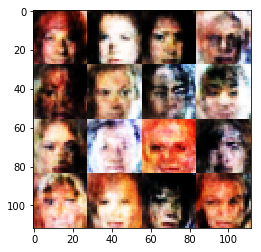

Epoch 1/2... Discriminator Loss: 0.8088... Generator Loss: 1.5778
Epoch 1/2... Discriminator Loss: 0.8989... Generator Loss: 1.5120
Epoch 1/2... Discriminator Loss: 0.8534... Generator Loss: 1.0401
Epoch 1/2... Discriminator Loss: 1.0086... Generator Loss: 1.4431
Epoch 1/2... Discriminator Loss: 0.7674... Generator Loss: 2.1114


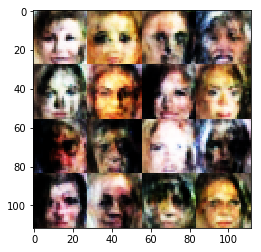

Epoch 1/2... Discriminator Loss: 0.8604... Generator Loss: 1.9742
Epoch 1/2... Discriminator Loss: 0.7077... Generator Loss: 2.0197
Epoch 1/2... Discriminator Loss: 0.8662... Generator Loss: 1.8496
Epoch 1/2... Discriminator Loss: 0.8965... Generator Loss: 1.9292
Epoch 1/2... Discriminator Loss: 0.8239... Generator Loss: 1.2669


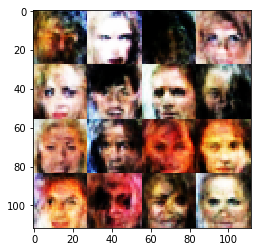

Epoch 1/2... Discriminator Loss: 0.8585... Generator Loss: 1.6563
Epoch 1/2... Discriminator Loss: 0.8416... Generator Loss: 1.4746
Epoch 1/2... Discriminator Loss: 0.8270... Generator Loss: 2.1630
Epoch 1/2... Discriminator Loss: 0.9784... Generator Loss: 1.2837
Epoch 1/2... Discriminator Loss: 0.7450... Generator Loss: 1.7591


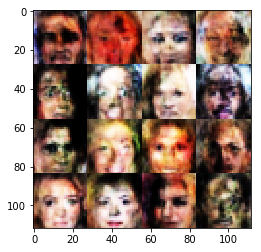

Epoch 1/2... Discriminator Loss: 0.9657... Generator Loss: 1.6280
Epoch 1/2... Discriminator Loss: 1.1693... Generator Loss: 1.1822
Epoch 1/2... Discriminator Loss: 0.9580... Generator Loss: 1.7340
Epoch 1/2... Discriminator Loss: 0.9642... Generator Loss: 1.0685
Epoch 1/2... Discriminator Loss: 1.0444... Generator Loss: 1.1665


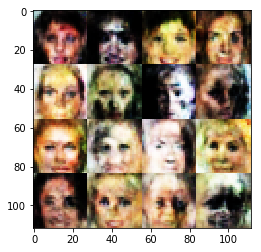

Epoch 1/2... Discriminator Loss: 0.9151... Generator Loss: 1.5070
Epoch 1/2... Discriminator Loss: 1.0194... Generator Loss: 1.5753
Epoch 1/2... Discriminator Loss: 0.7163... Generator Loss: 1.5846
Epoch 1/2... Discriminator Loss: 0.7574... Generator Loss: 1.1520
Epoch 1/2... Discriminator Loss: 0.7564... Generator Loss: 2.2439


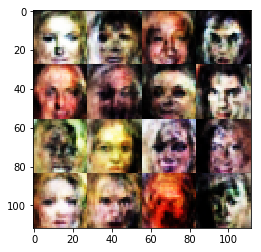

Epoch 1/2... Discriminator Loss: 1.0696... Generator Loss: 1.7122
Epoch 1/2... Discriminator Loss: 0.8492... Generator Loss: 1.9699
Epoch 1/2... Discriminator Loss: 0.7393... Generator Loss: 1.6267
Epoch 1/2... Discriminator Loss: 0.8352... Generator Loss: 1.7417
Epoch 1/2... Discriminator Loss: 0.9014... Generator Loss: 1.8270


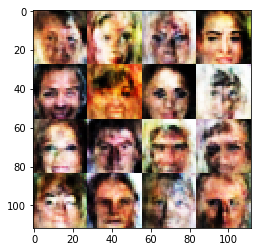

Epoch 1/2... Discriminator Loss: 0.7307... Generator Loss: 1.6313
Epoch 1/2... Discriminator Loss: 1.4018... Generator Loss: 1.1405
Epoch 1/2... Discriminator Loss: 1.1166... Generator Loss: 0.9472
Epoch 1/2... Discriminator Loss: 1.0827... Generator Loss: 1.2590
Epoch 1/2... Discriminator Loss: 0.7639... Generator Loss: 1.4459


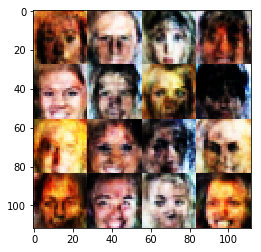

Epoch 1/2... Discriminator Loss: 0.7495... Generator Loss: 2.0037
Epoch 1/2... Discriminator Loss: 0.8795... Generator Loss: 1.5450
Epoch 1/2... Discriminator Loss: 0.8877... Generator Loss: 1.4475
Epoch 1/2... Discriminator Loss: 0.8731... Generator Loss: 1.6241
Epoch 1/2... Discriminator Loss: 0.9119... Generator Loss: 1.6892


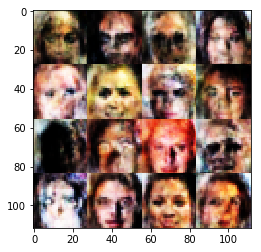

Epoch 1/2... Discriminator Loss: 0.8598... Generator Loss: 1.5772
Epoch 1/2... Discriminator Loss: 0.7248... Generator Loss: 1.8789
Epoch 1/2... Discriminator Loss: 1.2964... Generator Loss: 0.9421
Epoch 1/2... Discriminator Loss: 0.6842... Generator Loss: 1.5414
Epoch 1/2... Discriminator Loss: 1.0206... Generator Loss: 1.0908


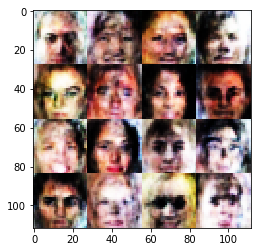

Epoch 1/2... Discriminator Loss: 0.8371... Generator Loss: 1.5563
Epoch 1/2... Discriminator Loss: 0.9769... Generator Loss: 1.2278
Epoch 1/2... Discriminator Loss: 0.9237... Generator Loss: 1.5827
Epoch 1/2... Discriminator Loss: 0.8447... Generator Loss: 1.8790
Epoch 1/2... Discriminator Loss: 0.8075... Generator Loss: 1.8541


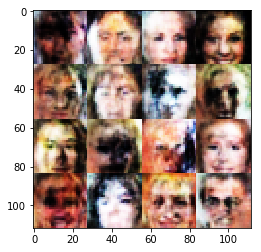

Epoch 1/2... Discriminator Loss: 0.7638... Generator Loss: 1.5822
Epoch 1/2... Discriminator Loss: 0.7424... Generator Loss: 1.3364
Epoch 1/2... Discriminator Loss: 0.9246... Generator Loss: 1.8876
Epoch 1/2... Discriminator Loss: 0.8633... Generator Loss: 1.7870
Epoch 1/2... Discriminator Loss: 0.7244... Generator Loss: 1.5733


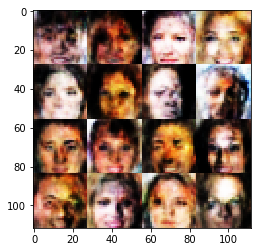

Epoch 1/2... Discriminator Loss: 0.9879... Generator Loss: 1.4250
Epoch 1/2... Discriminator Loss: 0.8719... Generator Loss: 1.5236
Epoch 1/2... Discriminator Loss: 0.8451... Generator Loss: 1.8689
Epoch 1/2... Discriminator Loss: 0.8167... Generator Loss: 1.8978
Epoch 1/2... Discriminator Loss: 0.7131... Generator Loss: 1.9285


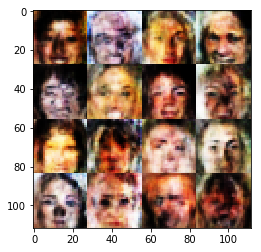

Epoch 1/2... Discriminator Loss: 0.7517... Generator Loss: 1.6590
Epoch 1/2... Discriminator Loss: 0.8180... Generator Loss: 1.5844
Epoch 1/2... Discriminator Loss: 1.0993... Generator Loss: 1.3623
Epoch 1/2... Discriminator Loss: 0.7578... Generator Loss: 2.0003
Epoch 1/2... Discriminator Loss: 0.7458... Generator Loss: 1.7228


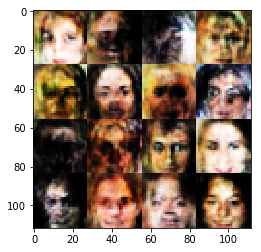

Epoch 1/2... Discriminator Loss: 0.9451... Generator Loss: 1.4572
Epoch 1/2... Discriminator Loss: 0.9604... Generator Loss: 1.1485
Epoch 1/2... Discriminator Loss: 0.9184... Generator Loss: 1.9186
Epoch 1/2... Discriminator Loss: 0.8743... Generator Loss: 1.5355
Epoch 1/2... Discriminator Loss: 1.1899... Generator Loss: 1.0715


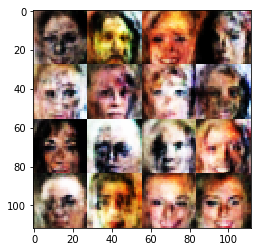

Epoch 1/2... Discriminator Loss: 0.7875... Generator Loss: 1.6906
Epoch 1/2... Discriminator Loss: 0.7640... Generator Loss: 1.5085
Epoch 1/2... Discriminator Loss: 0.8836... Generator Loss: 1.7587
Epoch 1/2... Discriminator Loss: 0.9350... Generator Loss: 1.5338
Epoch 1/2... Discriminator Loss: 0.7632... Generator Loss: 1.8419


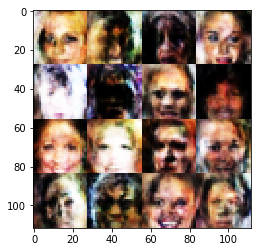

Epoch 1/2... Discriminator Loss: 0.8622... Generator Loss: 1.6054
Epoch 1/2... Discriminator Loss: 0.9128... Generator Loss: 1.7054
Epoch 1/2... Discriminator Loss: 0.7392... Generator Loss: 1.1926
Epoch 1/2... Discriminator Loss: 0.7918... Generator Loss: 1.6567
Epoch 1/2... Discriminator Loss: 0.9738... Generator Loss: 1.4302


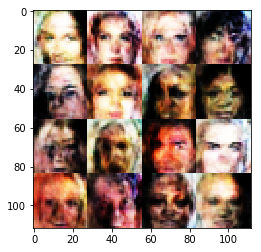

Epoch 1/2... Discriminator Loss: 1.1081... Generator Loss: 1.5450
Epoch 1/2... Discriminator Loss: 1.0669... Generator Loss: 1.7856
Epoch 1/2... Discriminator Loss: 0.9873... Generator Loss: 1.3511
Epoch 1/2... Discriminator Loss: 1.0617... Generator Loss: 1.2854
Epoch 1/2... Discriminator Loss: 0.8039... Generator Loss: 1.4817


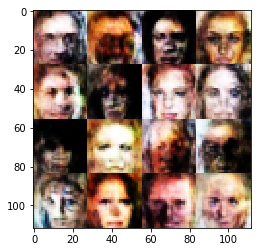

Epoch 1/2... Discriminator Loss: 0.9656... Generator Loss: 1.6031
Epoch 1/2... Discriminator Loss: 0.9092... Generator Loss: 1.3136
Epoch 1/2... Discriminator Loss: 0.9150... Generator Loss: 1.1366
Epoch 1/2... Discriminator Loss: 0.6496... Generator Loss: 1.7648
Epoch 1/2... Discriminator Loss: 0.8640... Generator Loss: 1.6150


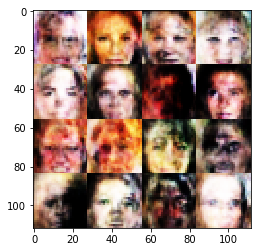

Epoch 1/2... Discriminator Loss: 0.7815... Generator Loss: 1.6873
Epoch 1/2... Discriminator Loss: 1.0091... Generator Loss: 1.0833
Epoch 1/2... Discriminator Loss: 0.8234... Generator Loss: 1.4007
Epoch 1/2... Discriminator Loss: 0.8393... Generator Loss: 1.6878
Epoch 1/2... Discriminator Loss: 0.8254... Generator Loss: 1.5487


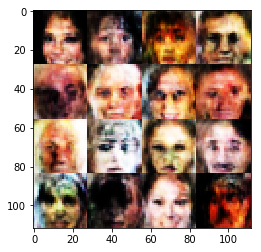

Epoch 1/2... Discriminator Loss: 0.7116... Generator Loss: 1.9620
Epoch 1/2... Discriminator Loss: 0.8567... Generator Loss: 2.0607
Epoch 1/2... Discriminator Loss: 0.9805... Generator Loss: 2.1141
Epoch 1/2... Discriminator Loss: 0.9082... Generator Loss: 1.5258
Epoch 1/2... Discriminator Loss: 0.9595... Generator Loss: 2.0175


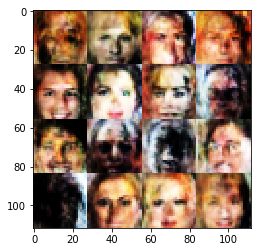

Epoch 1/2... Discriminator Loss: 0.7559... Generator Loss: 1.8954
Epoch 1/2... Discriminator Loss: 0.7958... Generator Loss: 1.6955


KeyboardInterrupt: 

In [15]:
batch_size = 32
z_dim = 100
learning_rate = 0.0004
beta1 = 0.6


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.